In [30]:
import pandas as pd
import numpy as np
from urllib.request import urlopen
import certifi
import json
import os
import ssl
from datetime import datetime
import pickle

# Custom packages
import derive_features as dd
from kama_msr import KAMA_MSR

import warnings
warnings.filterwarnings("ignore")

# Getting Master Feature DF

In [31]:
us_equity_df = pd.read_csv('data/ready/us_equity.csv', header=[0,1], index_col=0)
int_equity_df = pd.read_csv('data/ready/int_equity.csv', header=[0,1], index_col=0)
commodity_df = pd.read_csv('data/ready/commodity.csv', header=[0,1], index_col=0)
macro_daily_df = pd.read_csv('data/ready/macro_data_daily.csv', header=0, index_col=0)

macro_daily_df.columns = pd.MultiIndex.from_product([['macro_daily'], macro_daily_df.columns])

us_equity_df.index = pd.to_datetime(us_equity_df.index)
int_equity_df.index = pd.to_datetime(int_equity_df.index)
commodity_df.index = pd.to_datetime(commodity_df.index)
macro_daily_df.index = pd.to_datetime(macro_daily_df.index)

master_df = pd.concat([us_equity_df, int_equity_df, commodity_df, macro_daily_df], axis=1,\
                      keys=['us_equity', 'int_equity', 'commodity', 'macro_daily'])


In [27]:
master_df.columns.get_level_values(0).unique()

Index(['us_equity', 'int_equity', 'commodity', 'macro_daily'], dtype='object')

In [32]:
master_df

us_equity                                              \
           SPDR S&P 500 ETF                                               
                       open open_lag1d high_lag1d low_lag1d close_lag1d   
date                                                                      
1990-01-02              NaN        NaN        NaN       NaN         NaN   
1990-01-03              NaN        NaN        NaN       NaN         NaN   
1990-01-04              NaN        NaN        NaN       NaN         NaN   
1990-01-05              NaN        NaN        NaN       NaN         NaN   
1990-01-08              NaN        NaN        NaN       NaN         NaN   
...                     ...        ...        ...       ...         ...   
2025-10-27           682.73     676.46     678.47    675.65      677.25   
2025-10-28           687.05     682.73     685.54    682.12      685.24   
2025-10-29           688.72     687.05     688.91    684.83      687.06   
2025-10-30           683.90     688.72     689.70    682.87      687.39   
2025-10-31           685.04     683.90     685.94    679.83      679.83   

                                                                             \
                                                                              
           volume_lag1d vwap_lag1d log_ret_overnight log_ret_intraday_lag1d   
date                                                                          
1990-01-02          NaN        NaN               NaN                    NaN   
1990-01-03          NaN        NaN               NaN                    NaN   
1990-01-04          NaN        NaN               NaN                    NaN   
1990-01-05          NaN        NaN               NaN                    NaN   
1990-01-08          NaN        NaN               NaN                    NaN   
...                 ...        ...               ...                    ...   
2025-10-27   74356527.0    677.060          0.008059               0.001167   
2025-10-28   63339800.0    683.830          0.002638               0.003670   
2025-10-29   61738100.0    686.870          0.002413               0.000015   
2025-10-30   85657100.0    686.285         -0.005090              -0.001933   
2025-10-31   76335800.0    682.885          0.007634              -0.005969   

                          ...                                macro_daily  \
                          ...                                macro_daily   
           log_ret_lag1d  ... CBOE Volatility Index (VIX) (VIXCLS) lag1d   
date                      ...                                              
1990-01-02           NaN  ...                                        NaN   
1990-01-03           NaN  ...                                      17.24   
1990-01-04           NaN  ...                                      18.19   
1990-01-05           NaN  ...                                      19.22   
1990-01-08           NaN  ...                                      20.11   
...                  ...  ...                                        ...   
2025-10-27      0.008139  ...                                      16.37   
2025-10-28      0.011729  ...                                      15.79   
2025-10-29      0.002652  ...                                      16.42   
2025-10-30      0.000480  ...                                      16.92   
2025-10-31     -0.011059  ...                                      16.91   

                                                                 \
                                                                  
           VIX 5d EMA lag1d VIX 22d EMA lag1d VIX 63d EMA lag1d   
date                                                              
1990-01-02              NaN               NaN               NaN   
1990-01-03        17.240000         17.240000         17.240000   
1990-01-04        17.556667         17.322609         17.269687   
1990-01-05        18.111111         17.487599         17.330635   
1990-01-08        18.777407  

In [33]:
master_df.loc[:'2025-10-24'].to_csv('data/master_df.csv', index=True)

# Getting Master Label DF

In [5]:
def load_and_analyze_KAMA_MSR_model(asset_name: str, n_regimes: int, sub_folder: str, edte_sub_folder: str) -> None:
    pkl_file_path = f'saved_models/KAMA_MSR/{sub_folder}/{edte_sub_folder}/{asset_name}_KAMA-MSR_{n_regimes*2}-regimes.pkl'
    with open(pkl_file_path, 'rb') as f:
        loaded_model = pickle.load(f)

    print("="*80)
    print("LOADED MODEL INFORMATION")
    print("="*80)

    # ============================================================================
    # 2. ACCESS KAMA PARAMETERS
    # ============================================================================
    print("\n2. KAMA PARAMETERS:")
    print("-" * 40)
    print(f"KAMA n: {loaded_model.kama.n}")
    print(f"KAMA n_fast: {loaded_model.kama.n_fast}")
    print(f"    KAMA k_fast: {loaded_model.kama.k_fast:.6f}")
    print(f"KAMA n_slow: {loaded_model.kama.n_slow}")
    print(f"    KAMA k_slow: {loaded_model.kama.k_slow:.6f}")
    print(f"gamma: {loaded_model.gamma}")

    # ============================================================================
    # 3. ACCESS PRIORS (AFTER OPTIMIZATION)
    # ============================================================================
    print("\n3. MSR PRIORS:")
    print("-" * 40)

    # The priors used during model initialization
    priors = loaded_model.msr.priors
    for param, value in priors.items():
        print(f"{param}: {value}")

    # ============================================================================
    # 4. ACCESS MODEL CONFIGURATION
    # ============================================================================
    print("\n4. MODEL CONFIGURATION:")
    print("-" * 40)
    print(f"use_three_state_msr: {loaded_model.use_three_state_msr}")
    print(f"Number of combined regimes: {loaded_model.n_combined_regimes}")
    print(f"MSR n_regimes: {loaded_model.msr.n_regimes}")

    # ============================================================================
    # 5. CHECK DATA DIMENSIONS
    # ============================================================================
    print("\n5. DATA INFORMATION:")
    print("-" * 40)
    if loaded_model.prices is not None:
        print(f"Price data length: {len(loaded_model.prices)}")
        print(f"Return data length: {len(loaded_model.returns)}")
        print(f"Regime labels length: {len(loaded_model.regime_labels.dropna())}")
        print(f"Regime changes: {(loaded_model.regime_labels.diff() != 0).sum()}")

    # ============================================================================
    # 6. ACCESS MSR PARAMETERS (AFTER FITTING)
    # ============================================================================
    print("\n6. MSR PARAMETERS (Post-Fit):")
    print("-" * 40)
    print("MSR Means (μ):")
    for i, mean in enumerate(loaded_model.msr.means):
        print(f"  Regime {i}: {mean:.6f}")

    print("\nMSR Betas (β):")
    for i, beta in enumerate(loaded_model.msr.betas):
        print(f"  Regime {i}: {beta:.4f}")

    print("\nMSR Standard Deviations (σ):")
    for i, std in enumerate(loaded_model.msr.stds):
        print(f"  Regime {i}: {std:.6f}")

    print("\nMSR Transition Probabilities:")
    print("          To Regime:")
    print("From      0       1" + ("       2" if loaded_model.msr.n_regimes == 3 else ""))
    print("Regime")
    for i in range(loaded_model.msr.n_regimes):
        row = f"  {i}    "
        for j in range(loaded_model.msr.n_regimes):
            row += f"  {loaded_model.msr.transition_probs[i,j]:.3f}"
        print(row)


    # ============================================================================
    # 7. RUN ANALYSIS ON LOADED MODEL
    # ============================================================================
    print("\n7. RUNNING FULL ANALYSIS ON LOADED MODEL...")
    loaded_model.analyze_results(data_name=asset_name)
    regime_duration_stats = loaded_model.analyze_regime_durations()
    print("\nRegime Duration Statistics:")
    print(regime_duration_stats)
    loaded_model.regime_characteristics(data_name=asset_name)
    transition_results = loaded_model.regime_transition_analysis(in_depth=False)
    loaded_model.plot_regimes(data_name=asset_name)
    # loaded_model.plot_regime_duration_distribution()
    loaded_model.plot_comprehensive_analysis(data_name=asset_name)
    loaded_model.diagnostics(data_name=asset_name, trace_plots=False)
    
    return loaded_model, transition_results


In [6]:
asset_classes = {'us_equity': [], 'int_equity': [], 'commodity': []}
asset_classes['us_equity'] = master_df.xs('us_equity', level=0, axis=1).columns.get_level_values(0).unique().tolist()
asset_classes['int_equity'] = master_df.xs('int_equity', level=0, axis=1).columns.get_level_values(0).unique().tolist()
asset_classes['commodity'] = master_df.xs('commodity', level=0, axis=1).columns.get_level_values(0).unique().tolist()
KAMA_MSR_path_base = 'saved_models/KAMA_MSR/'

In [14]:
multiindex_tuples = [(asset_class, asset_name) for asset_class in asset_classes.keys() for asset_name in asset_classes[asset_class]]
master_label_df = pd.DataFrame(index=master_df.index,
                               columns=pd.MultiIndex.from_tuples(multiindex_tuples))



Analyzing SPDR S&P 500 ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 18
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 44
    KAMA k_slow: 0.044444
gamma: 1.3500000000000003

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data length: 6042
Return data length: 6041
Regime labels length: 6023
Regime changes: 57

6. MSR PARAMETERS (Post-Fit):
----------------------------------------
MSR Means (μ):
  Regime 0: 0.000477
  Regime 1: -0.002591

MSR Betas (β):
  Regime 0: -0.0127
  Regime 1: -0.0257

MSR Standard Deviations (σ):
  Regim

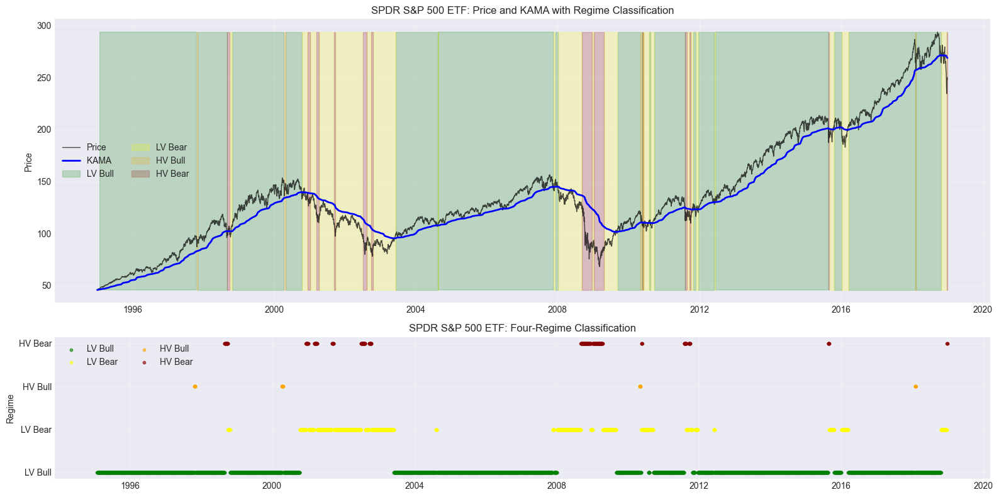

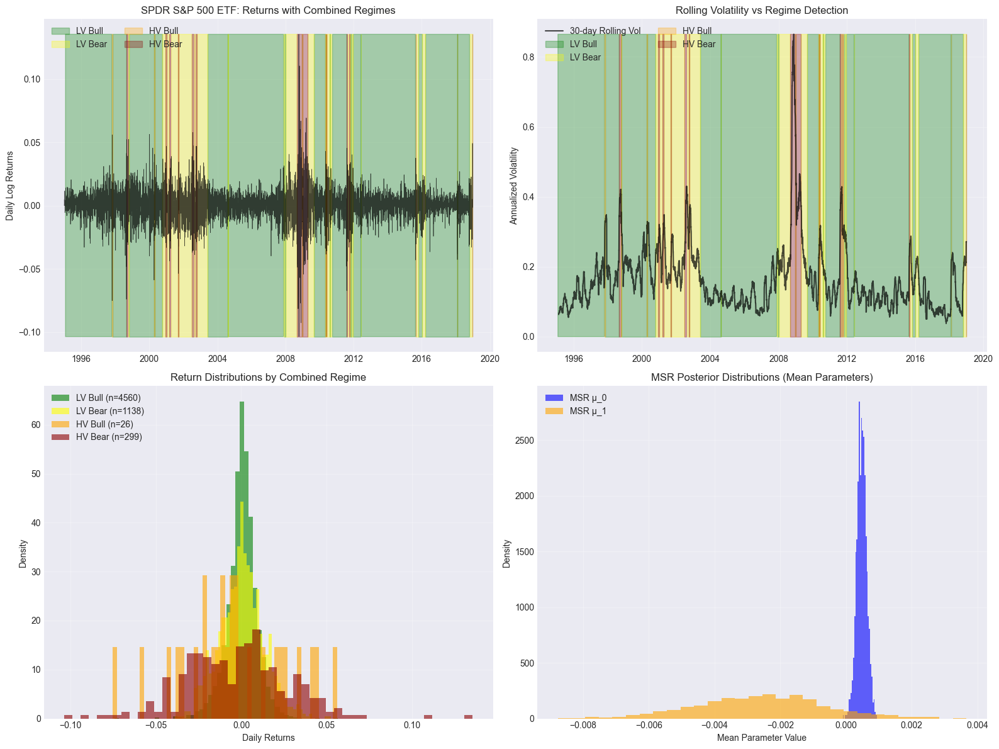


KAMA+MSR MODEL DIAGNOSTICS - SPDR S&P 500 ETF

Combined Model Fit Statistics:
Log-Likelihood: 18556.04
Average Log-Likelihood: 3.07

KAMA Tracking Error (vs returns): 0.011787
KAMA Efficiency Ratio (mean): 0.2381

Regime Stability:
  Total regime changes: 57
  Average regime duration: 104.2 periods
  Change frequency: 0.94%


Analyzing Invesco QQQ Trust in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 23
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 45
    KAMA k_slow: 0.043478
gamma: 1.5000000000000002

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-------------------------------

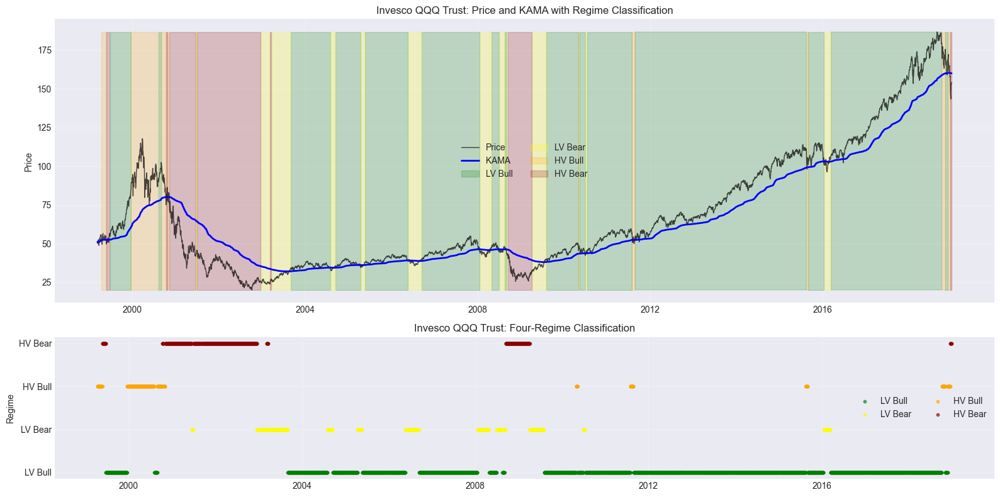

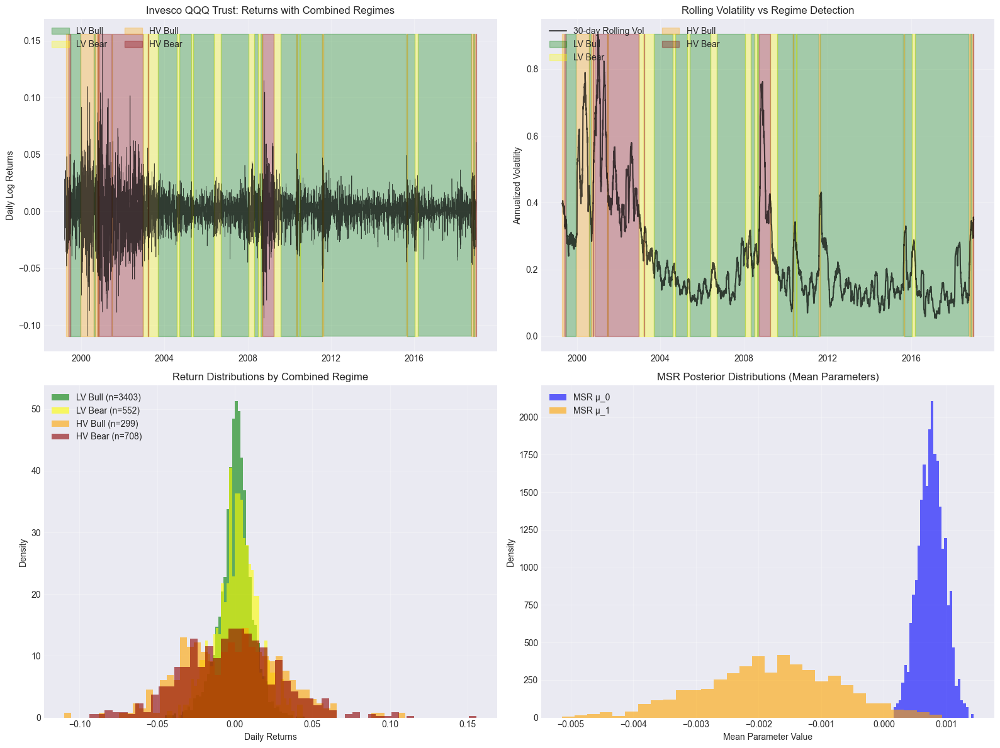


KAMA+MSR MODEL DIAGNOSTICS - INVESCO QQQ TRUST

Combined Model Fit Statistics:
Log-Likelihood: 13951.75
Average Log-Likelihood: 2.80

KAMA Tracking Error (vs returns): 0.017464
KAMA Efficiency Ratio (mean): 0.2186

Regime Stability:
  Total regime changes: 42
  Average regime duration: 115.9 periods
  Change frequency: 0.84%


Analyzing iShares Russell 2000 ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 14
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 44
    KAMA k_slow: 0.044444
gamma: 0.85

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-------------------------------------

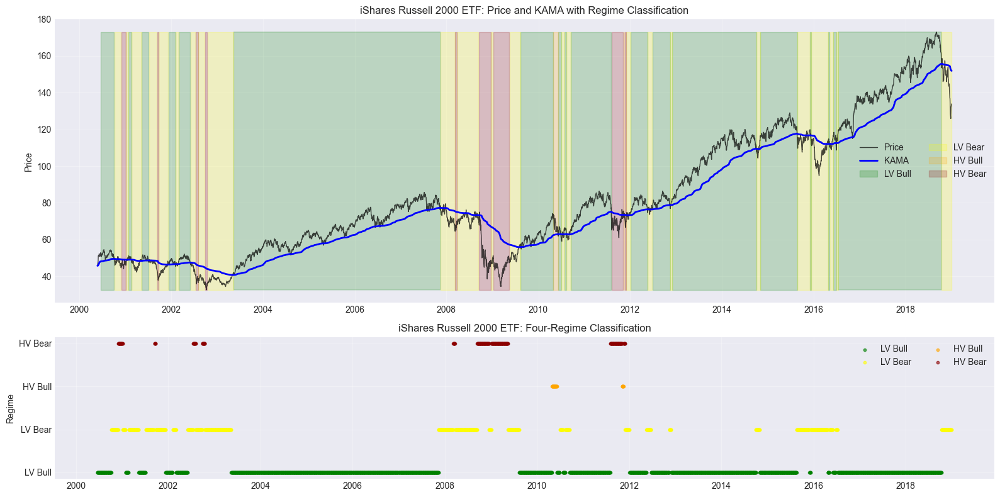

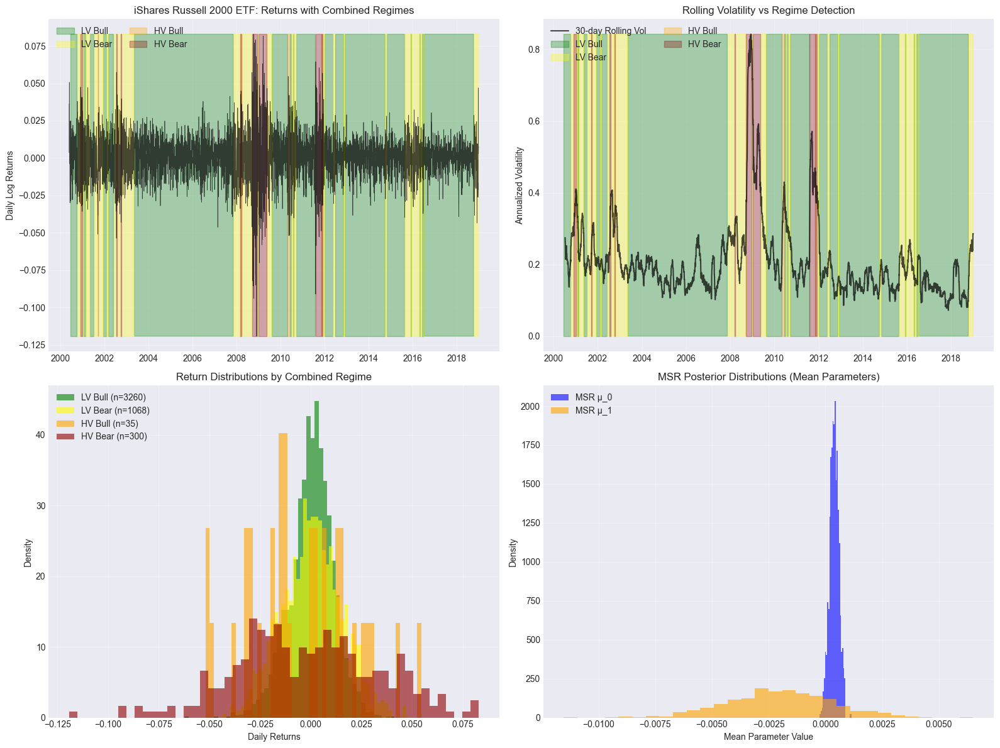


KAMA+MSR MODEL DIAGNOSTICS - ISHARES RUSSELL 2000 ETF

Combined Model Fit Statistics:
Log-Likelihood: 13447.29
Average Log-Likelihood: 2.88

KAMA Tracking Error (vs returns): 0.014679
KAMA Efficiency Ratio (mean): 0.2587

Regime Stability:
  Total regime changes: 52
  Average regime duration: 88.2 periods
  Change frequency: 1.11%


Analyzing SPDR Dow Jones Industrial Average ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 13
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 45
    KAMA k_slow: 0.043478
gamma: 1.3500000000000003

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----

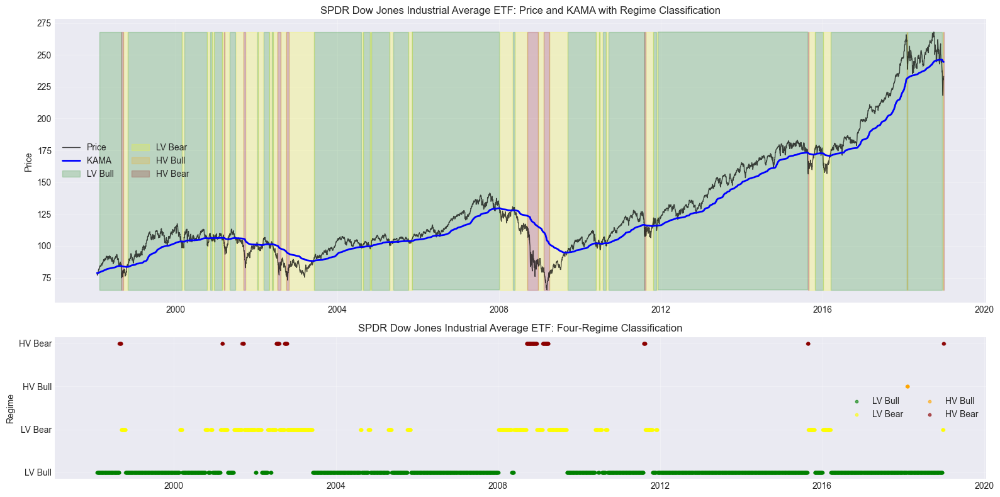

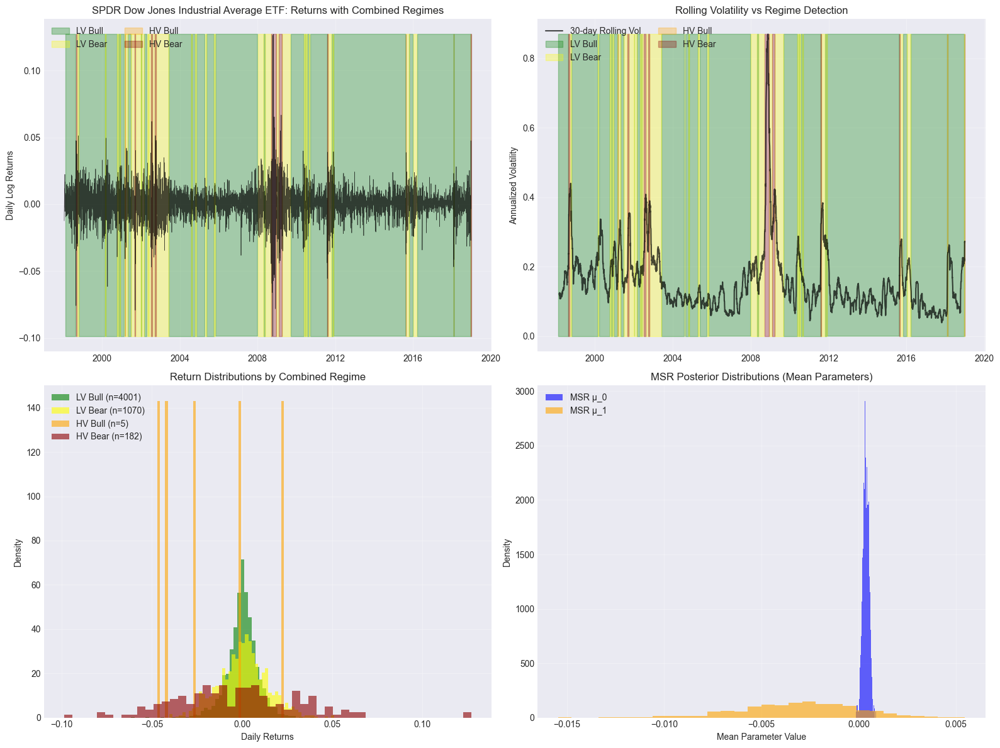


KAMA+MSR MODEL DIAGNOSTICS - SPDR DOW JONES INDUSTRIAL AVERAGE ETF

Combined Model Fit Statistics:
Log-Likelihood: 16328.13
Average Log-Likelihood: 3.10

KAMA Tracking Error (vs returns): 0.011508
KAMA Efficiency Ratio (mean): 0.2878

Regime Stability:
  Total regime changes: 63
  Average regime duration: 82.4 periods
  Change frequency: 1.20%


Analyzing Energy Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 10
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 40
    KAMA k_slow: 0.048780
gamma: 1.6000000000000003

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
---

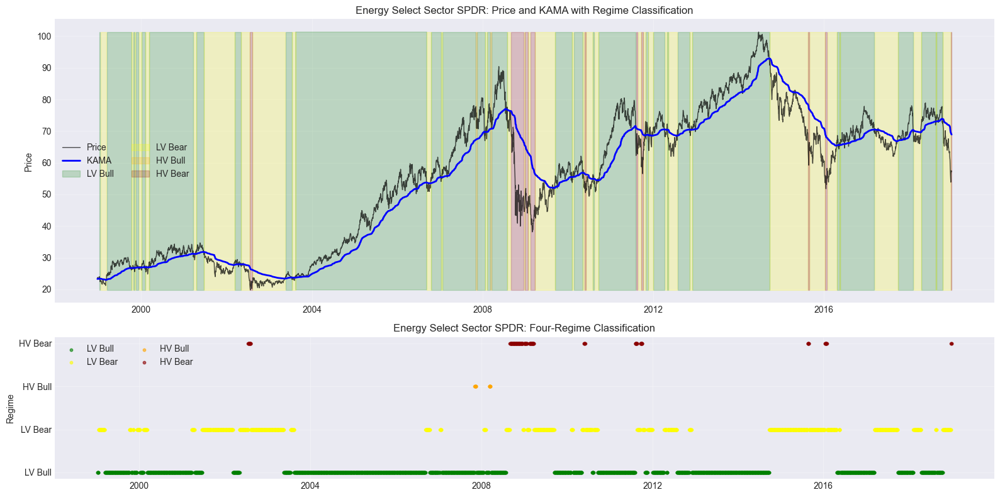

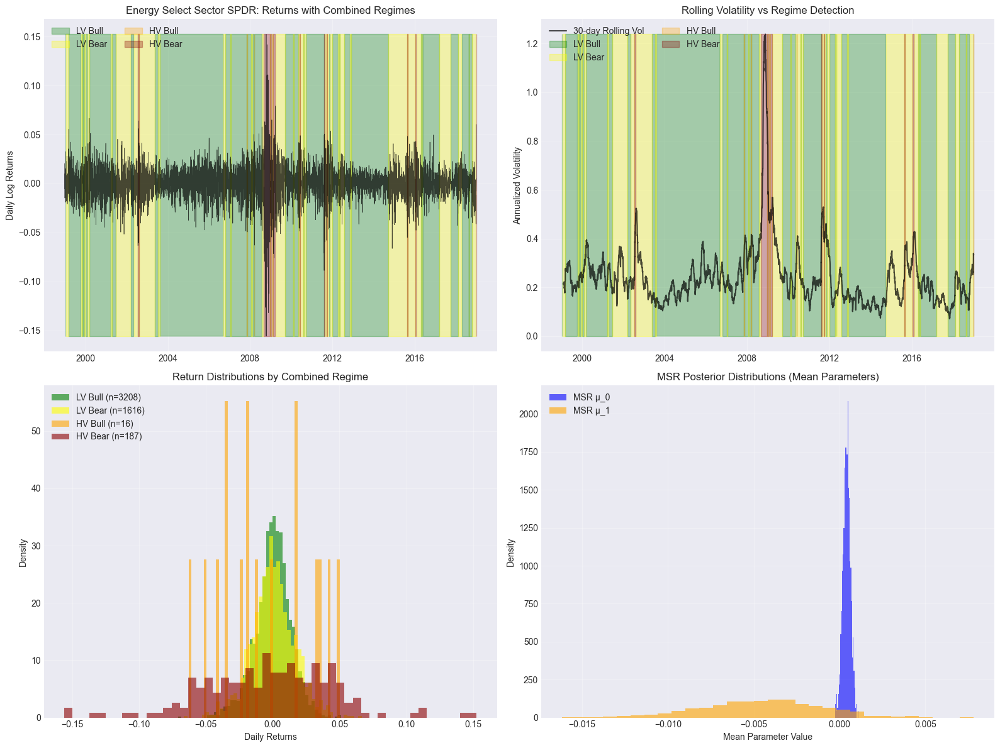


KAMA+MSR MODEL DIAGNOSTICS - ENERGY SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 13797.81
Average Log-Likelihood: 2.74

KAMA Tracking Error (vs returns): 0.016896
KAMA Efficiency Ratio (mean): 0.3114

Regime Stability:
  Total regime changes: 75
  Average regime duration: 66.3 periods
  Change frequency: 1.49%


Analyzing Financial Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 10
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 44
    KAMA k_slow: 0.044444
gamma: 1.4000000000000001

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
------------

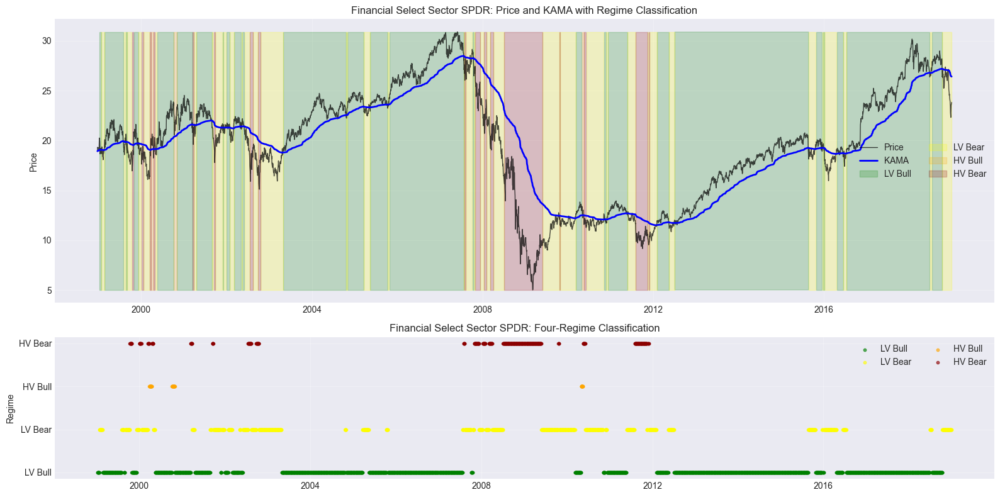

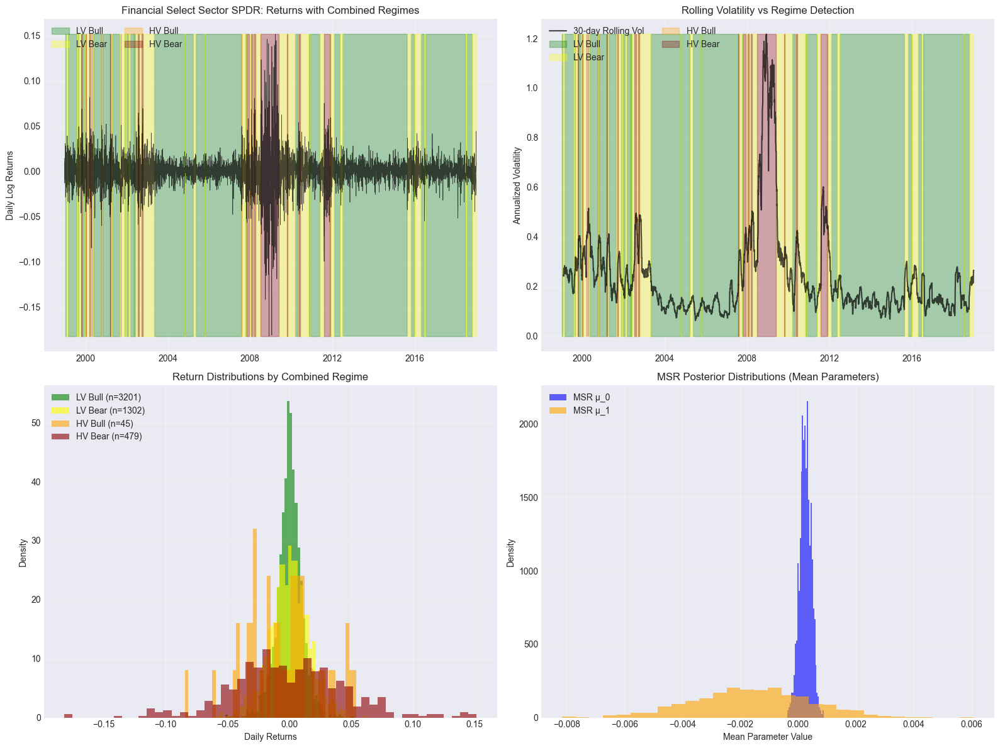


KAMA+MSR MODEL DIAGNOSTICS - FINANCIAL SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 14022.51
Average Log-Likelihood: 2.78

KAMA Tracking Error (vs returns): 0.018649
KAMA Efficiency Ratio (mean): 0.2977

Regime Stability:
  Total regime changes: 83
  Average regime duration: 60.0 periods
  Change frequency: 1.65%


Analyzing Utilities Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 18
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 44
    KAMA k_slow: 0.044444
gamma: 0.3

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
------------------------

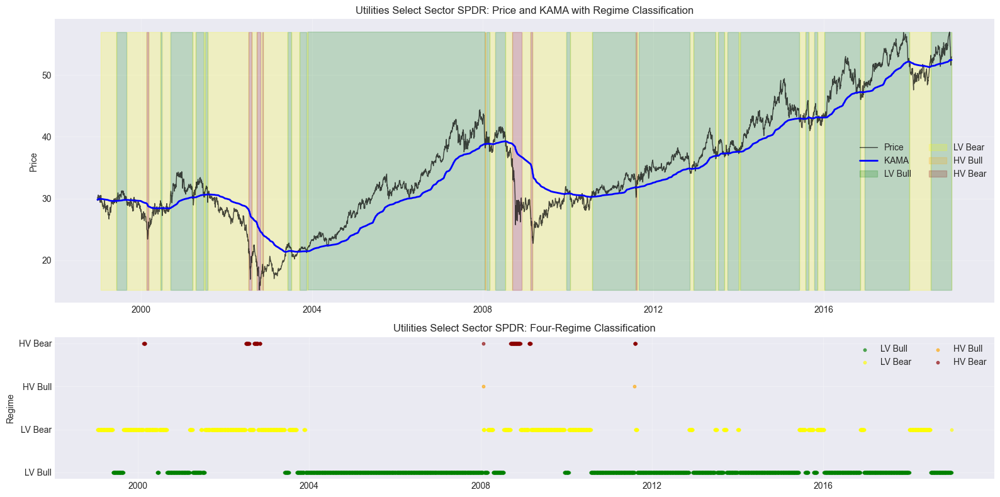

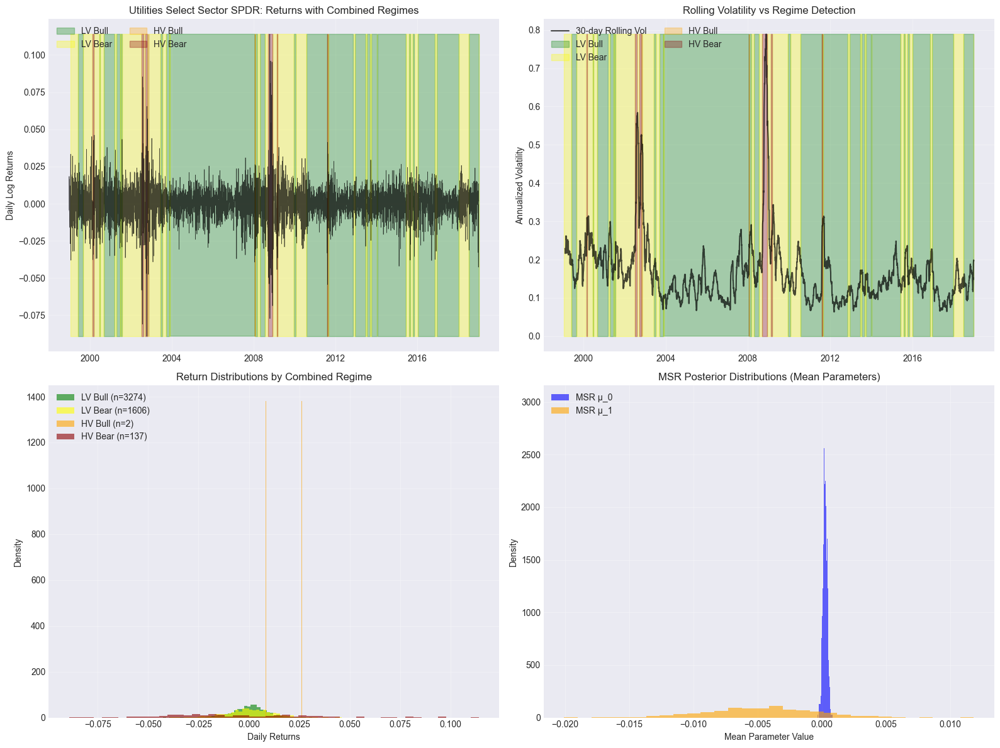


KAMA+MSR MODEL DIAGNOSTICS - UTILITIES SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 15403.48
Average Log-Likelihood: 3.06

KAMA Tracking Error (vs returns): 0.011698
KAMA Efficiency Ratio (mean): 0.2195

Regime Stability:
  Total regime changes: 60
  Average regime duration: 82.6 periods
  Change frequency: 1.19%


Analyzing Industrial Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 20
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 1.0

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-----------------------

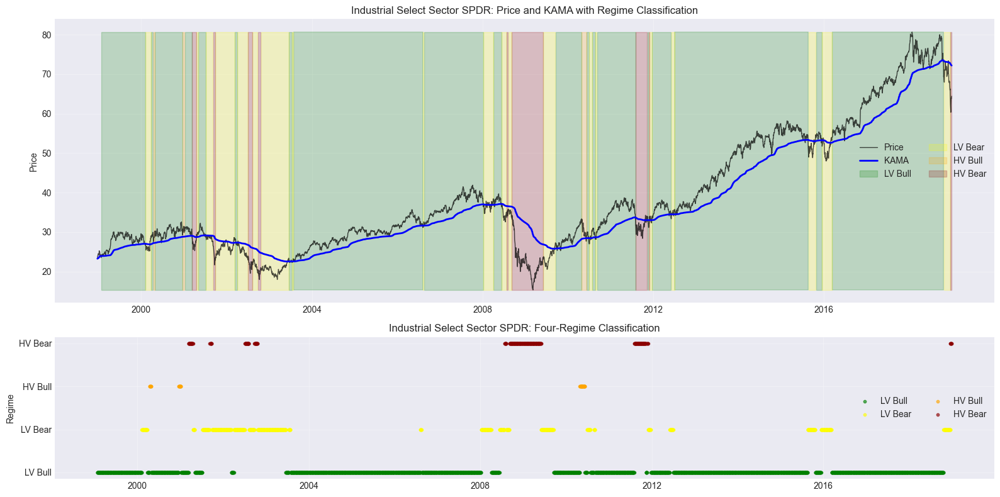

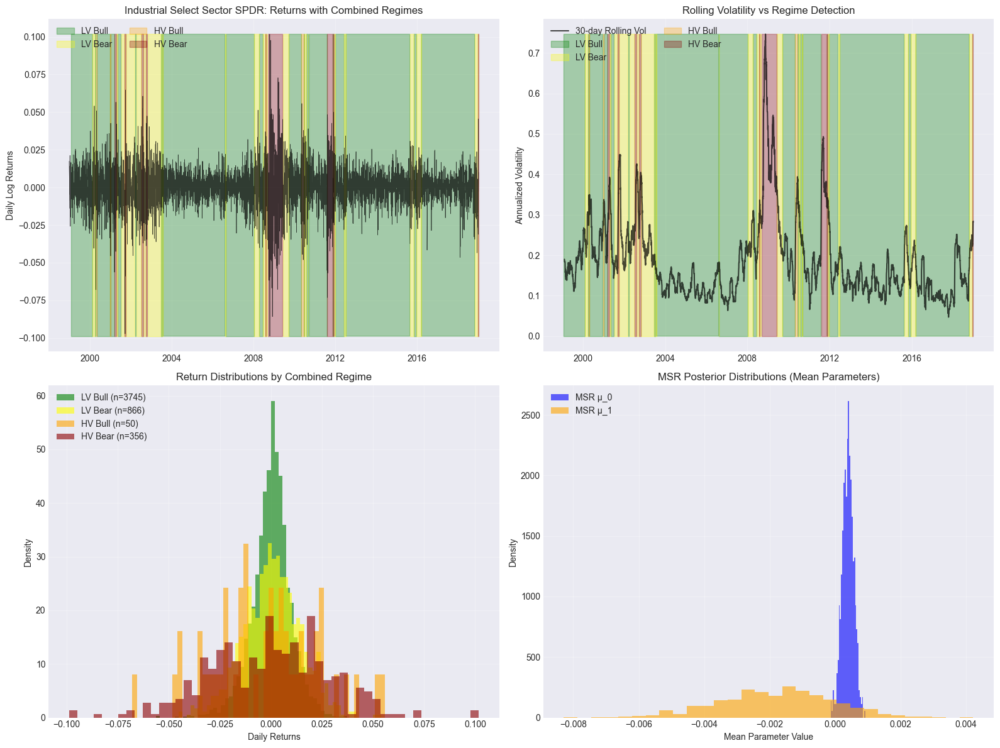


KAMA+MSR MODEL DIAGNOSTICS - INDUSTRIAL SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 14954.92
Average Log-Likelihood: 2.97

KAMA Tracking Error (vs returns): 0.013122
KAMA Efficiency Ratio (mean): 0.2250

Regime Stability:
  Total regime changes: 50
  Average regime duration: 98.8 periods
  Change frequency: 0.99%


Analyzing Health Care Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 24
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 45
    KAMA k_slow: 0.043478
gamma: 1.5000000000000002

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
------

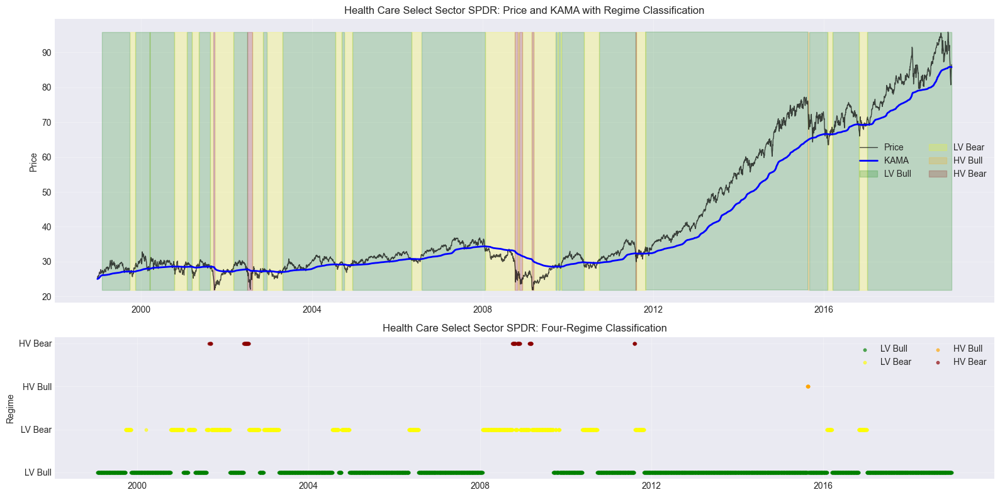

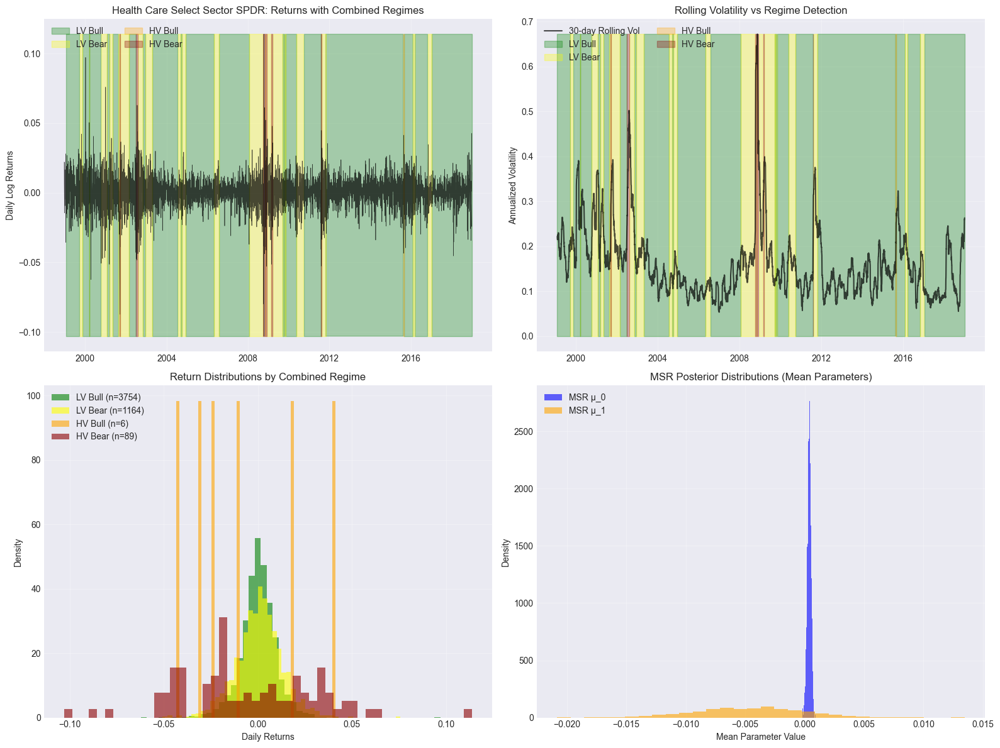


KAMA+MSR MODEL DIAGNOSTICS - HEALTH CARE SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 15470.81
Average Log-Likelihood: 3.07

KAMA Tracking Error (vs returns): 0.011287
KAMA Efficiency Ratio (mean): 0.1982

Regime Stability:
  Total regime changes: 46
  Average regime duration: 107.2 periods
  Change frequency: 0.91%


Analyzing Technology Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 8
KAMA n_fast: 11
    KAMA k_fast: 0.166667
KAMA n_slow: 33
    KAMA k_slow: 0.058824
gamma: 0.85

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
--------------------

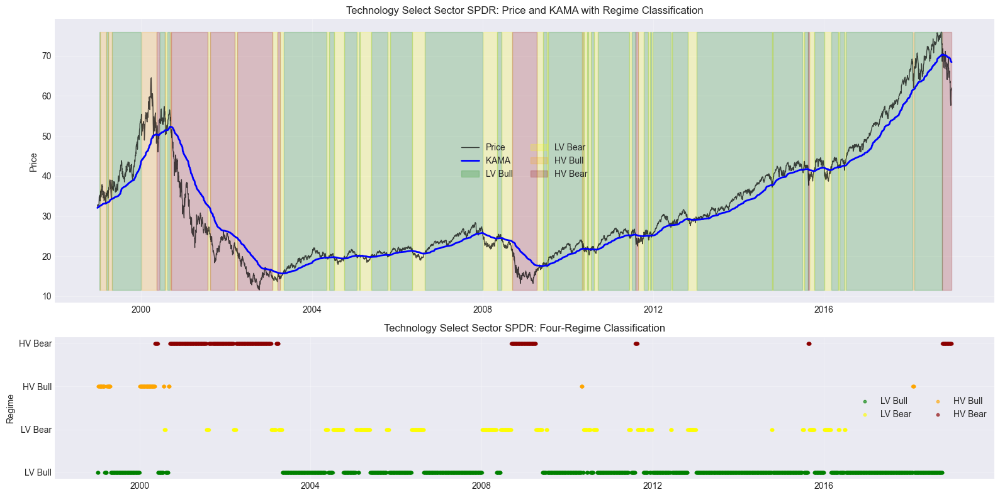

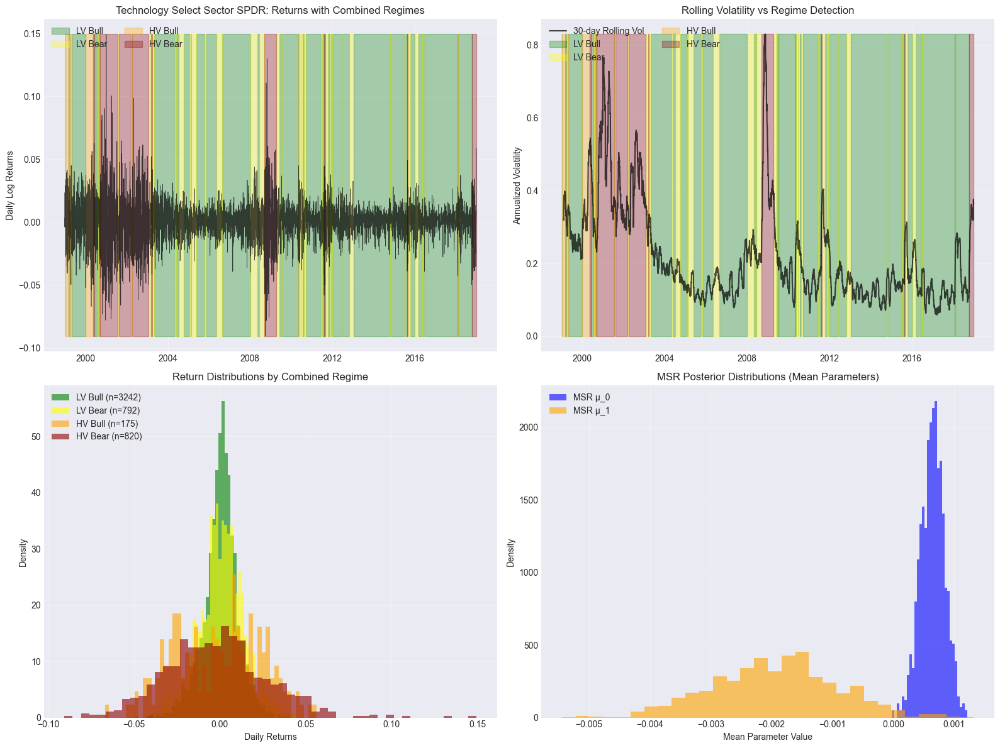


KAMA+MSR MODEL DIAGNOSTICS - TECHNOLOGY SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 14463.07
Average Log-Likelihood: 2.87

KAMA Tracking Error (vs returns): 0.015945
KAMA Efficiency Ratio (mean): 0.3639

Regime Stability:
  Total regime changes: 77
  Average regime duration: 64.6 periods
  Change frequency: 1.53%


Analyzing Materials Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 15
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 33
    KAMA k_slow: 0.058824
gamma: 1.25

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------

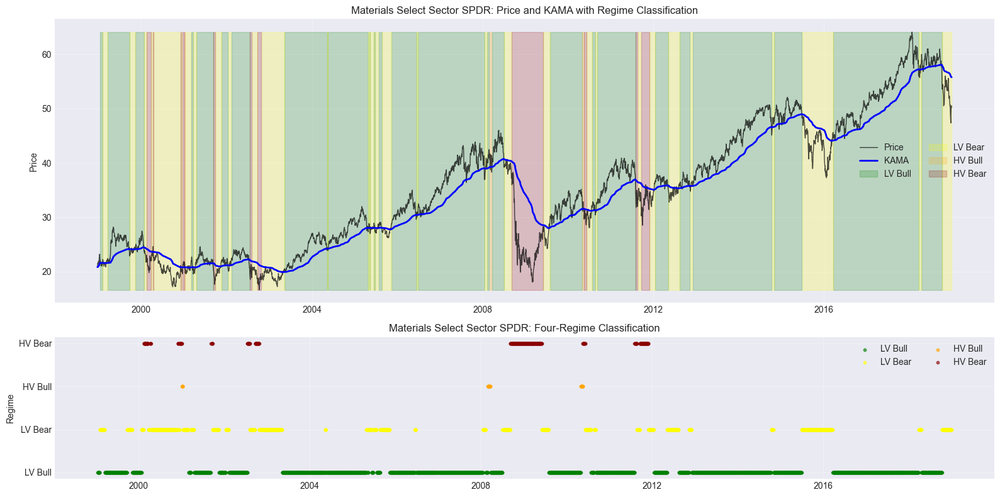

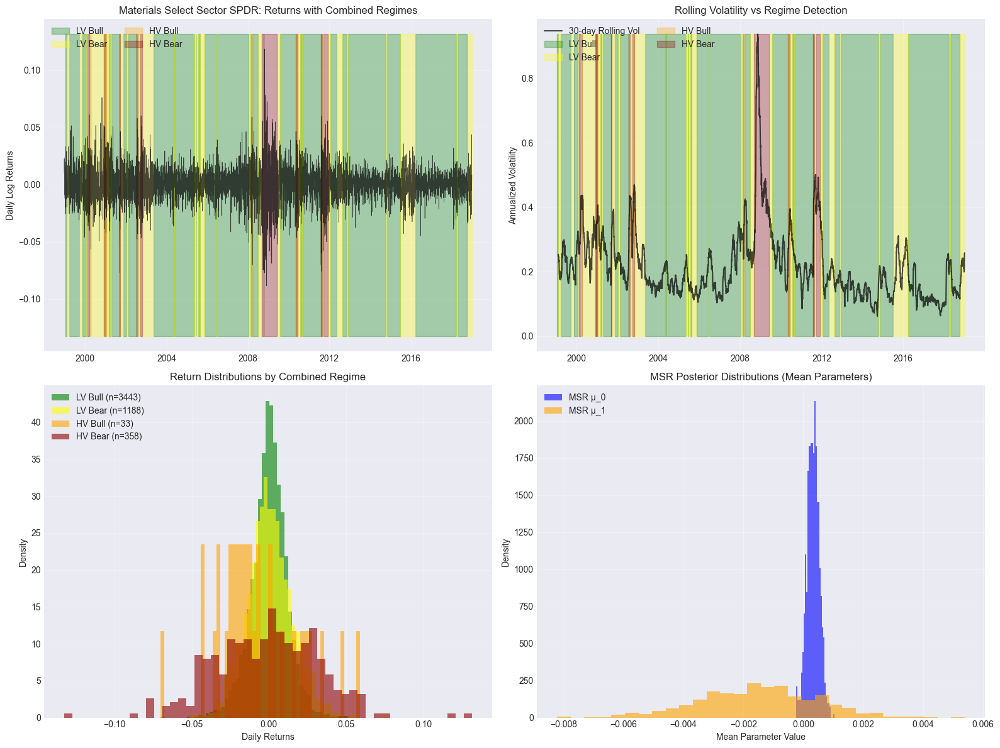


KAMA+MSR MODEL DIAGNOSTICS - MATERIALS SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 14221.95
Average Log-Likelihood: 2.82

KAMA Tracking Error (vs returns): 0.015085
KAMA Efficiency Ratio (mean): 0.2510

Regime Stability:
  Total regime changes: 69
  Average regime duration: 72.0 periods
  Change frequency: 1.37%


Analyzing Consumer Discretionary Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 20
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 38
    KAMA k_slow: 0.051282
gamma: 1.3500000000000003

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATI

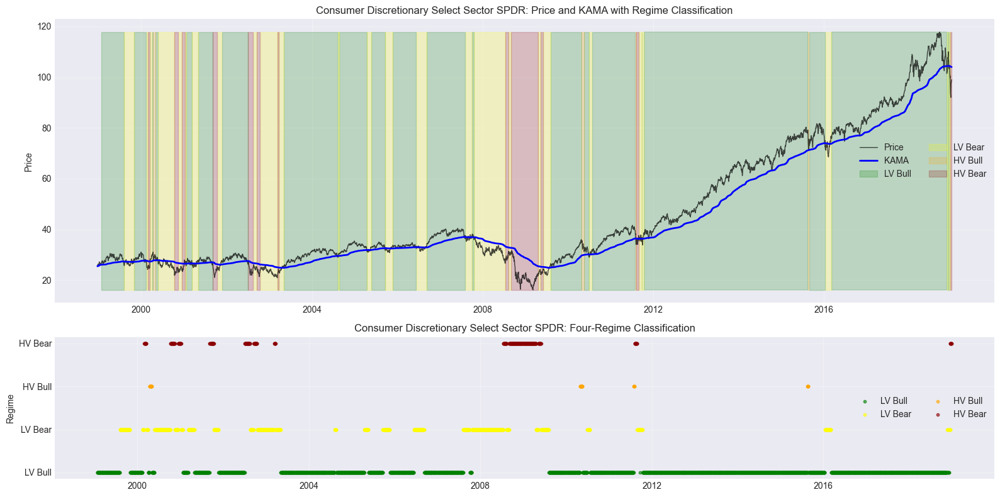

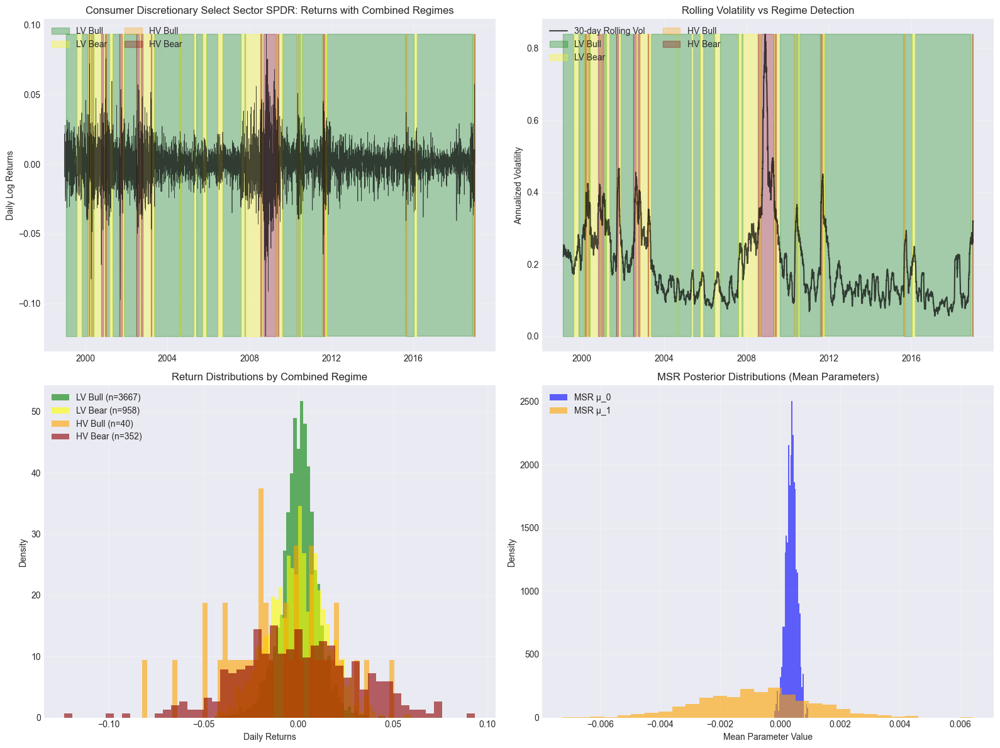


KAMA+MSR MODEL DIAGNOSTICS - CONSUMER DISCRETIONARY SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 14632.20
Average Log-Likelihood: 2.90

KAMA Tracking Error (vs returns): 0.013857
KAMA Efficiency Ratio (mean): 0.2184

Regime Stability:
  Total regime changes: 62
  Average regime duration: 80.0 periods
  Change frequency: 1.23%


Analyzing Consumer Staples Select Sector SPDR in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 21
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 40
    KAMA k_slow: 0.048780
gamma: 0.4

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----

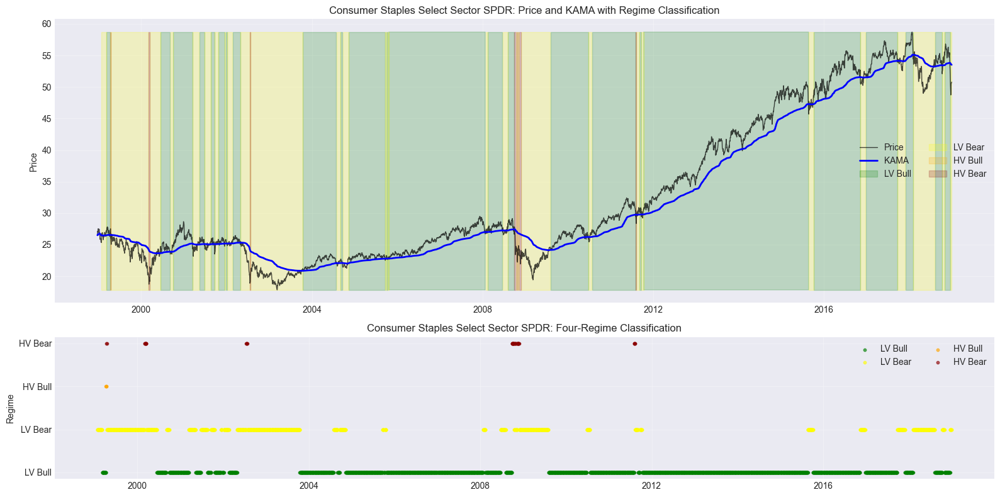

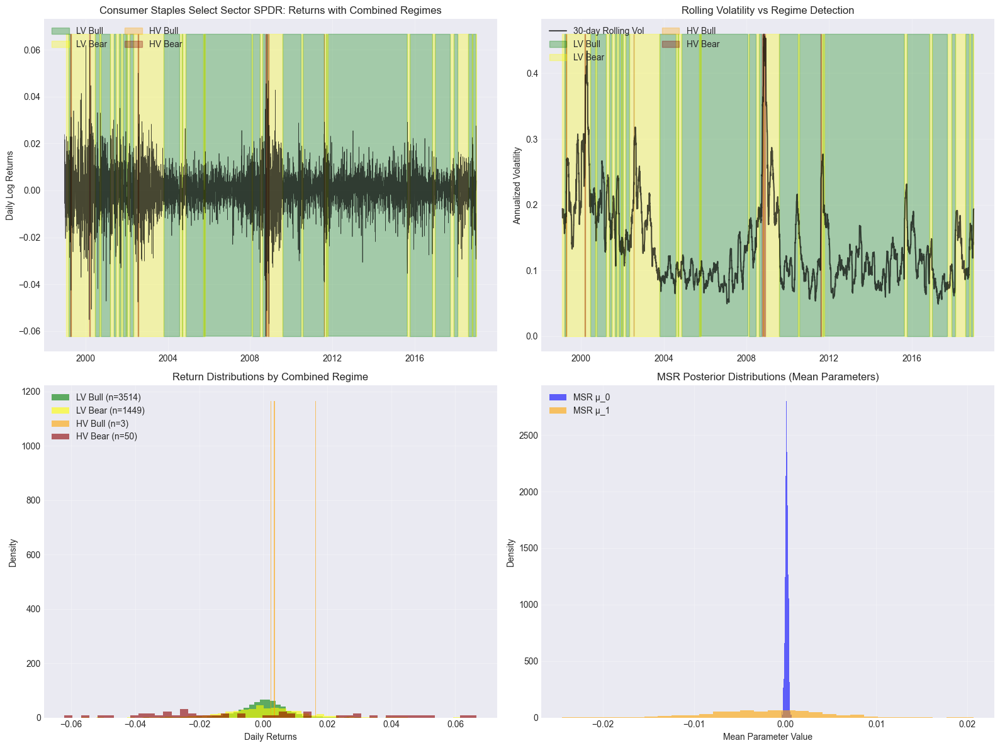


KAMA+MSR MODEL DIAGNOSTICS - CONSUMER STAPLES SELECT SECTOR SPDR

Combined Model Fit Statistics:
Log-Likelihood: 16220.60
Average Log-Likelihood: 3.22

KAMA Tracking Error (vs returns): 0.009450
KAMA Efficiency Ratio (mean): 0.1966

Regime Stability:
  Total regime changes: 60
  Average regime duration: 82.6 periods
  Change frequency: 1.19%


Analyzing iShares S&P 500 Growth ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 13
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 35
    KAMA k_slow: 0.055556
gamma: 0.9

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-------------------

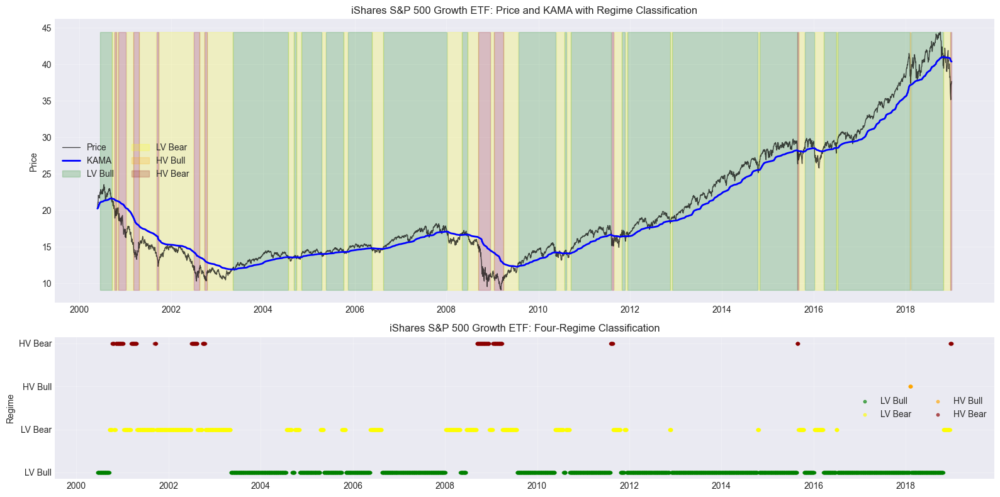

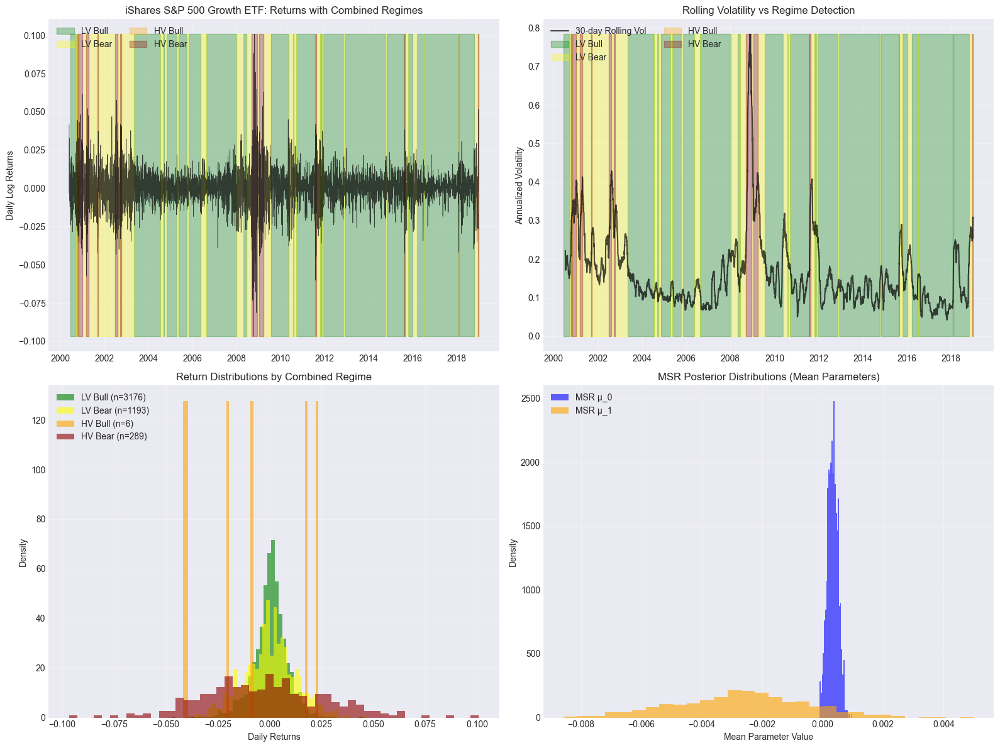


KAMA+MSR MODEL DIAGNOSTICS - ISHARES S&P 500 GROWTH ETF

Combined Model Fit Statistics:
Log-Likelihood: 14392.75
Average Log-Likelihood: 3.08

KAMA Tracking Error (vs returns): 0.011772
KAMA Efficiency Ratio (mean): 0.2747

Regime Stability:
  Total regime changes: 56
  Average regime duration: 82.1 periods
  Change frequency: 1.20%


Analyzing iShares S&P 500 Value ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 25
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.75

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------

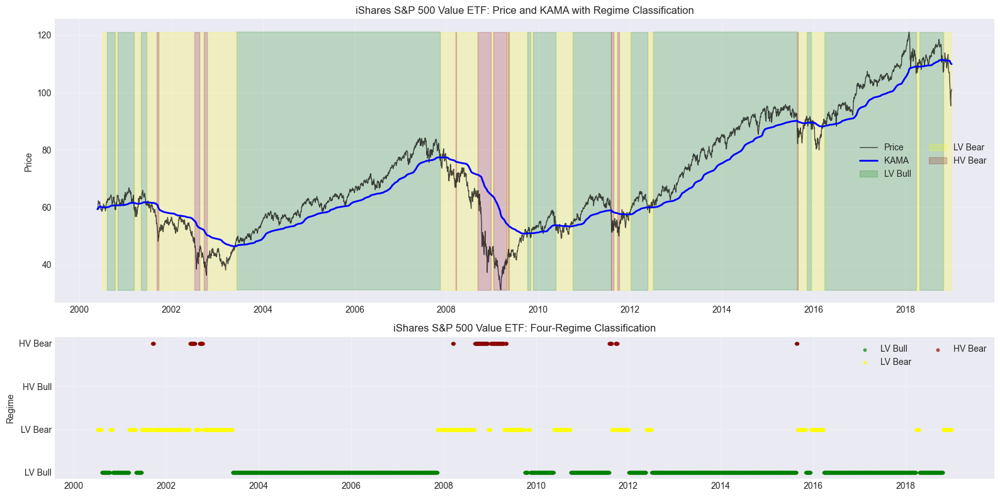

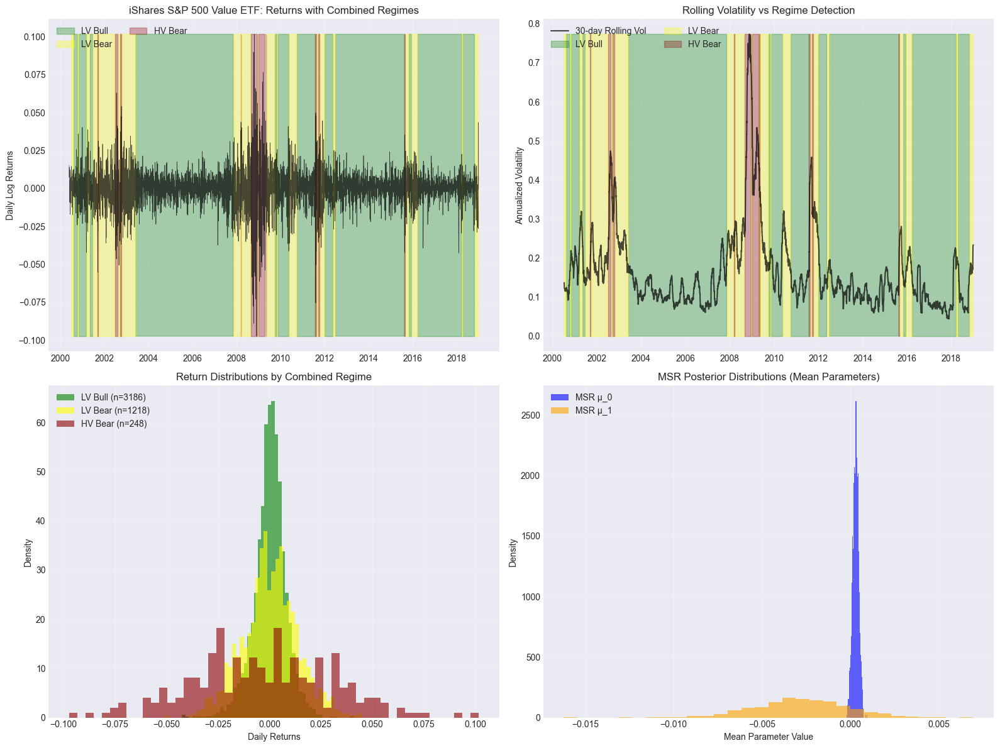


KAMA+MSR MODEL DIAGNOSTICS - ISHARES S&P 500 VALUE ETF

Combined Model Fit Statistics:
Log-Likelihood: 14202.71
Average Log-Likelihood: 3.04

KAMA Tracking Error (vs returns): 0.012222
KAMA Efficiency Ratio (mean): 0.1978

Regime Stability:
  Total regime changes: 42
  Average regime duration: 108.8 periods
  Change frequency: 0.90%


Analyzing iShares Russell 2000 Growth ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 25
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 28
    KAMA k_slow: 0.068966
gamma: 0.5

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-----------------------

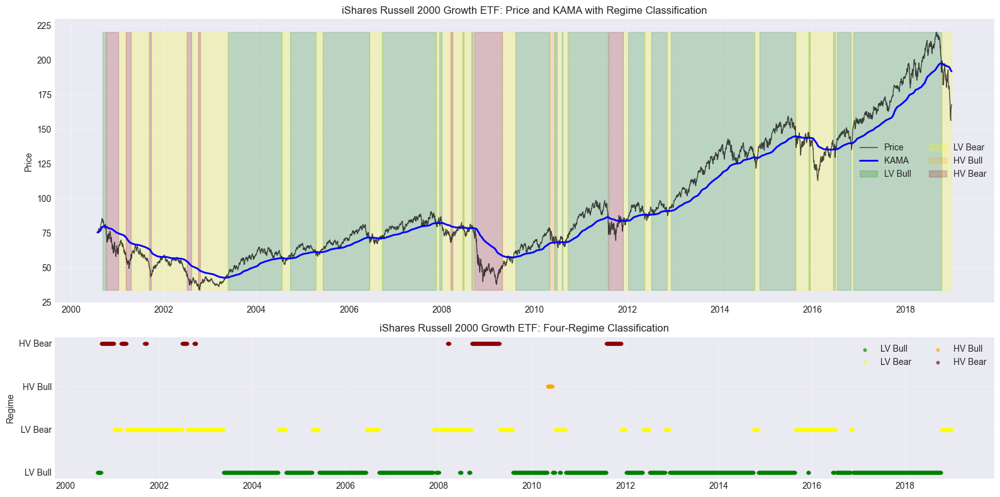

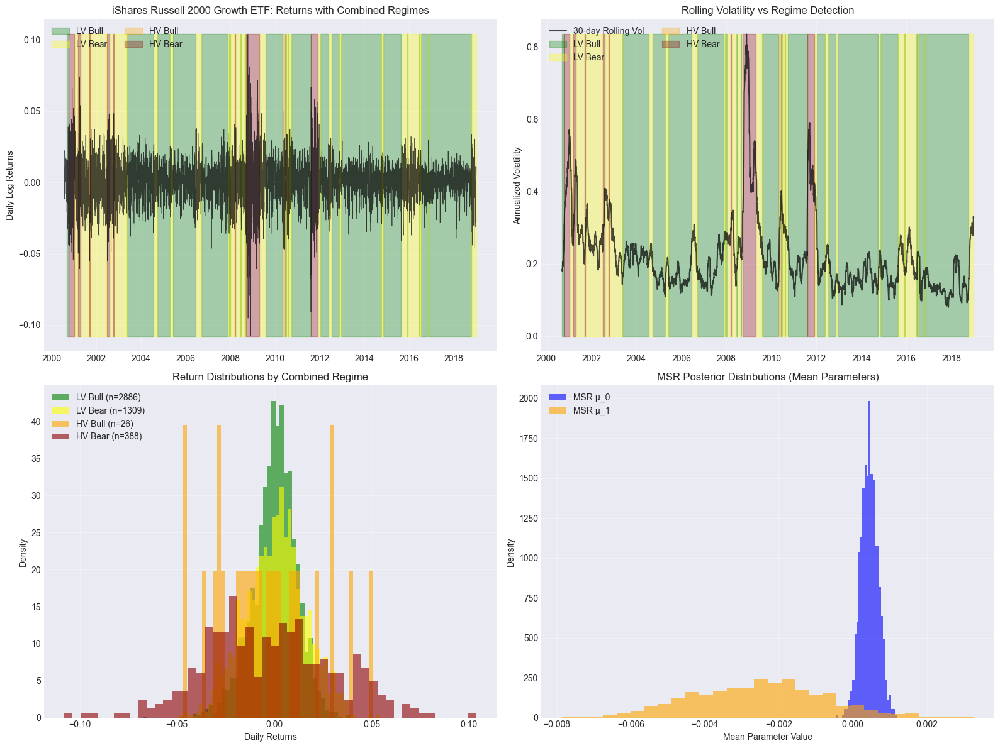


KAMA+MSR MODEL DIAGNOSTICS - ISHARES RUSSELL 2000 GROWTH ETF

Combined Model Fit Statistics:
Log-Likelihood: 12978.59
Average Log-Likelihood: 2.80

KAMA Tracking Error (vs returns): 0.015444
KAMA Efficiency Ratio (mean): 0.1977

Regime Stability:
  Total regime changes: 53
  Average regime duration: 85.8 periods
  Change frequency: 1.14%


Analyzing iShares Russell 2000 Value ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 10
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 35
    KAMA k_slow: 0.055556
gamma: 1.3500000000000003

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----

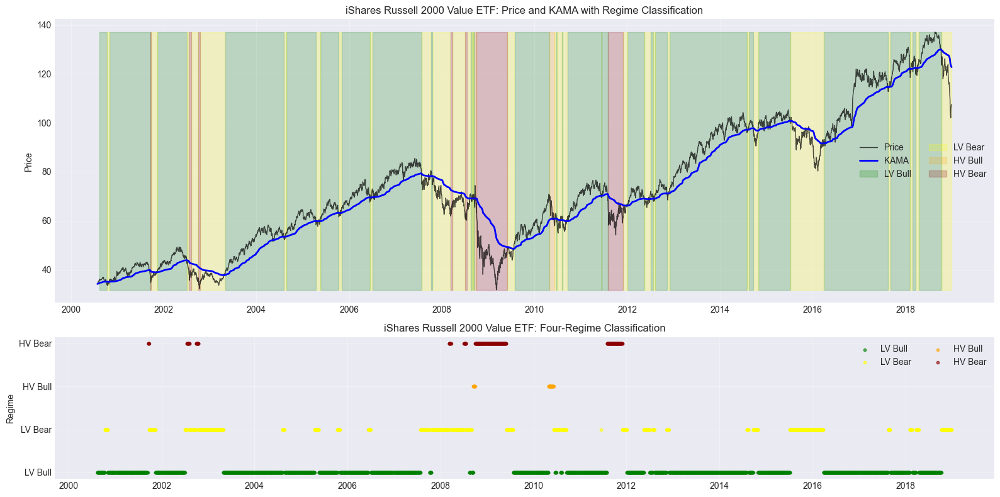

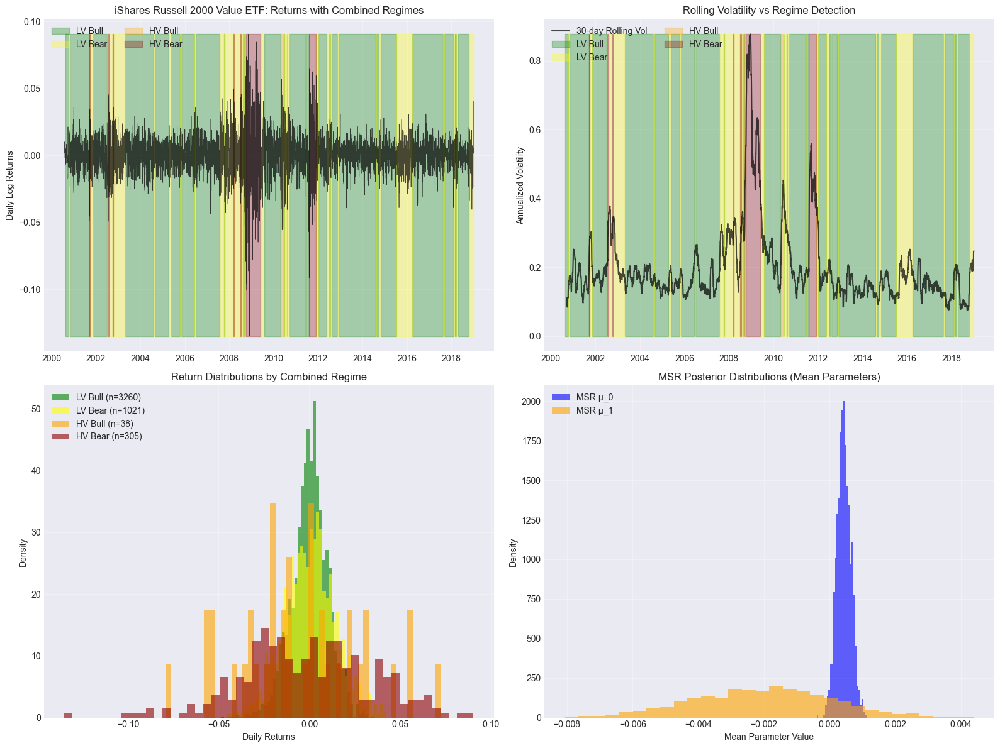


KAMA+MSR MODEL DIAGNOSTICS - ISHARES RUSSELL 2000 VALUE ETF

Combined Model Fit Statistics:
Log-Likelihood: 13639.42
Average Log-Likelihood: 2.94

KAMA Tracking Error (vs returns): 0.014290
KAMA Efficiency Ratio (mean): 0.3044

Regime Stability:
  Total regime changes: 64
  Average regime duration: 71.3 periods
  Change frequency: 1.38%


Analyzing iShares Russell Mid-Cap ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 15
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 28
    KAMA k_slow: 0.068966
gamma: 1.0

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-----------------------

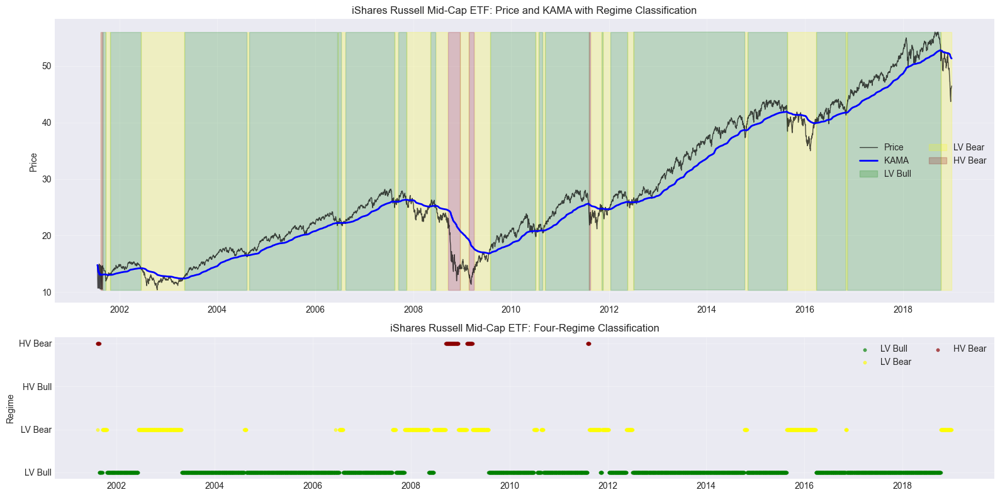

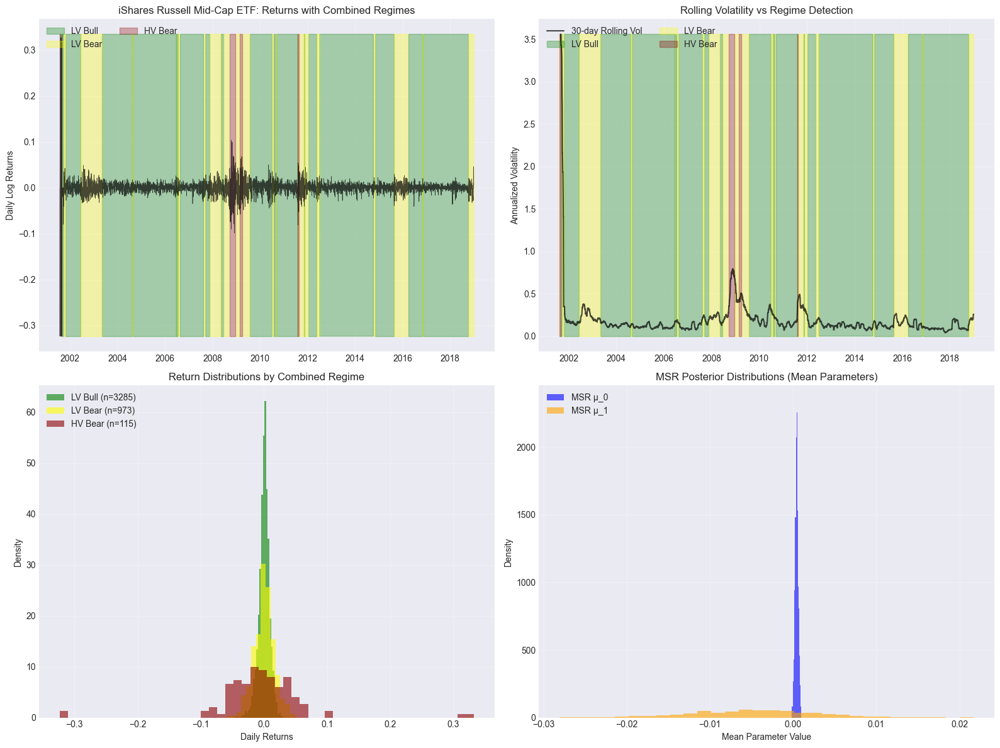


KAMA+MSR MODEL DIAGNOSTICS - ISHARES RUSSELL MID-CAP ETF

Combined Model Fit Statistics:
Log-Likelihood: 10562.47
Average Log-Likelihood: 2.41

KAMA Tracking Error (vs returns): 0.021653
KAMA Efficiency Ratio (mean): 0.2602

Regime Stability:
  Total regime changes: 40
  Average regime duration: 107.0 periods
  Change frequency: 0.91%


Analyzing iShares Micro-Cap ETF in asset class us_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 15
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.5

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-------------------------------

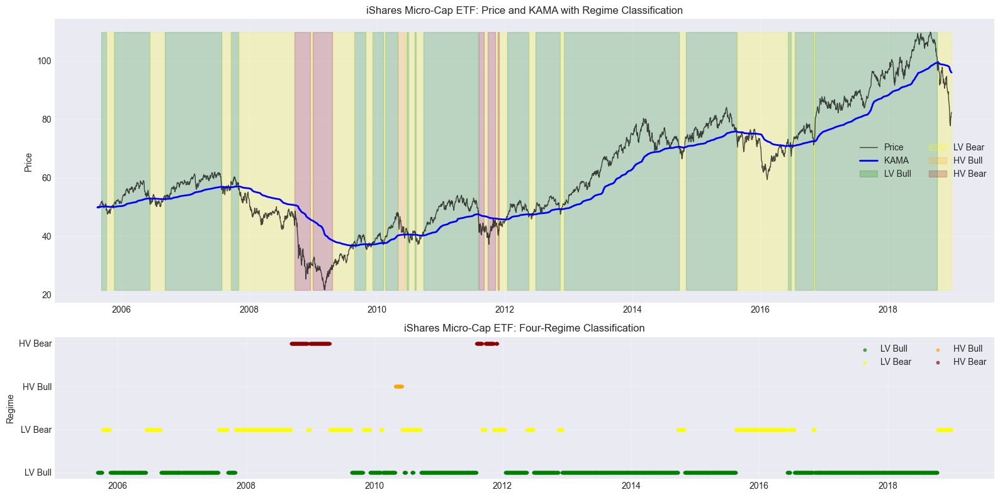

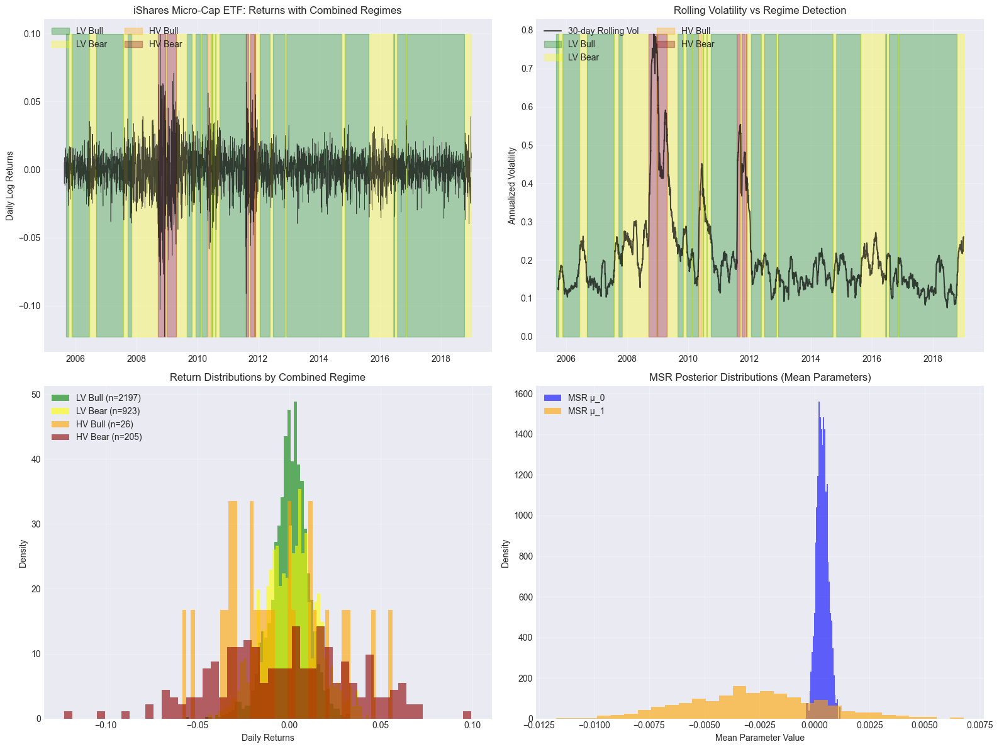


KAMA+MSR MODEL DIAGNOSTICS - ISHARES MICRO-CAP ETF

Combined Model Fit Statistics:
Log-Likelihood: 9678.52
Average Log-Likelihood: 2.88

KAMA Tracking Error (vs returns): 0.014744
KAMA Efficiency Ratio (mean): 0.2642

Regime Stability:
  Total regime changes: 43
  Average regime duration: 76.5 periods
  Change frequency: 1.28%


Analyzing Vanguard Total International Stock ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 15
KAMA n_fast: 3
    KAMA k_fast: 0.500000
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.75

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
---------------------

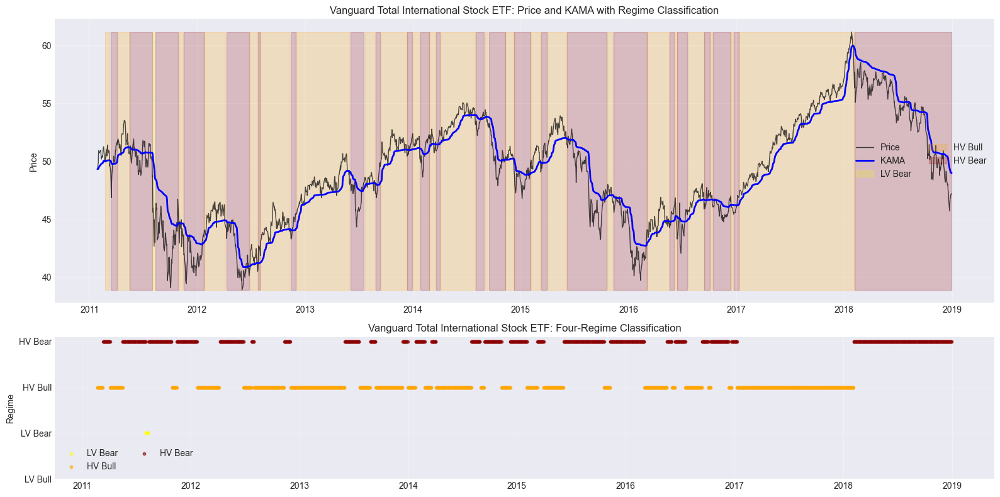

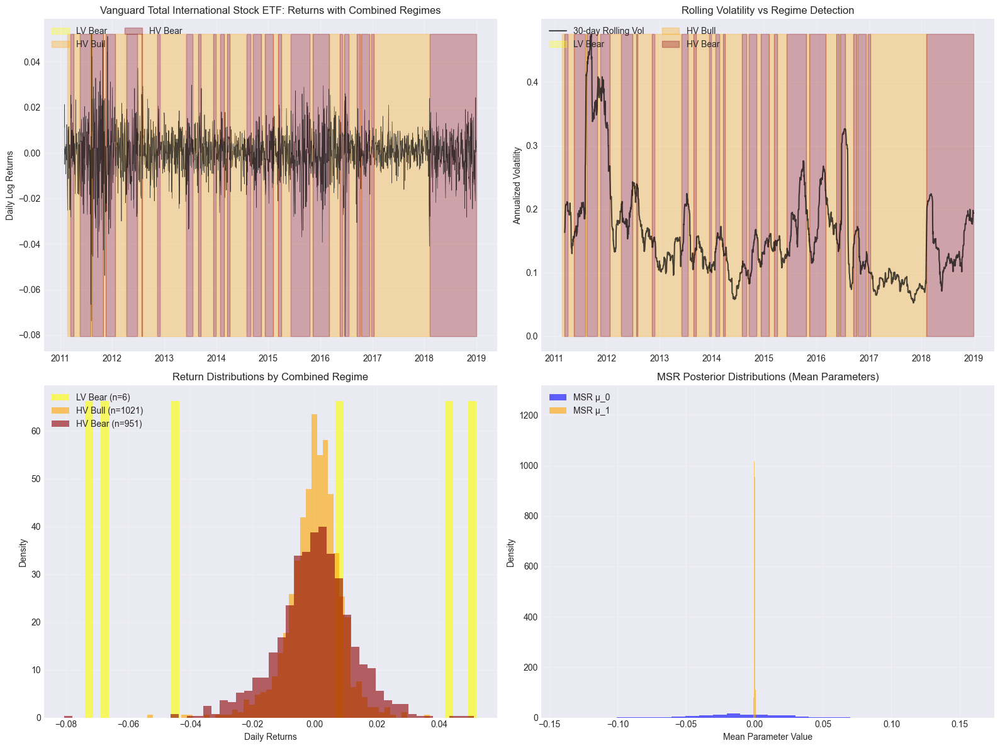


KAMA+MSR MODEL DIAGNOSTICS - VANGUARD TOTAL INTERNATIONAL STOCK ETF

Combined Model Fit Statistics:
Log-Likelihood: 6030.48
Average Log-Likelihood: 3.03

KAMA Tracking Error (vs returns): 0.010559
KAMA Efficiency Ratio (mean): 0.2399

Regime Stability:
  Total regime changes: 47
  Average regime duration: 41.5 periods
  Change frequency: 2.36%


Analyzing Vanguard FTSE Developed Markets ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 14
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 37
    KAMA k_slow: 0.052632
gamma: 0.85

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
------

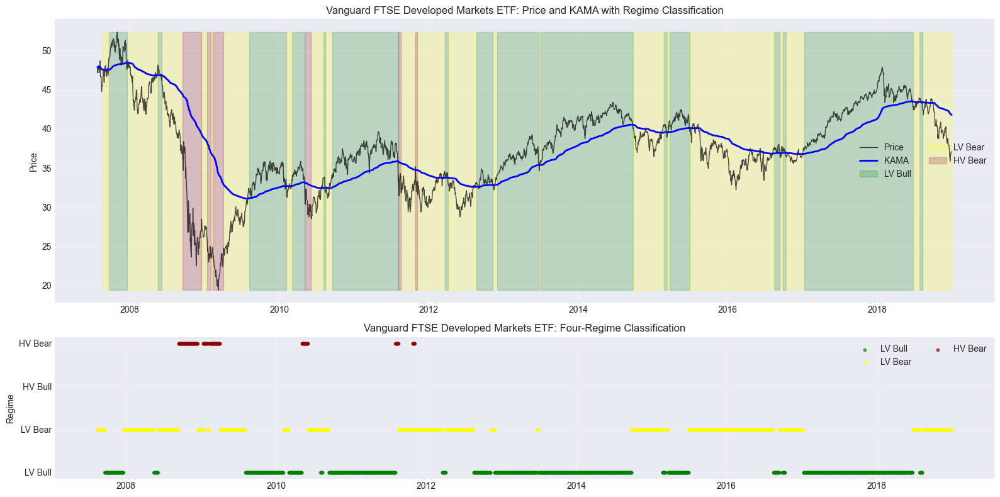

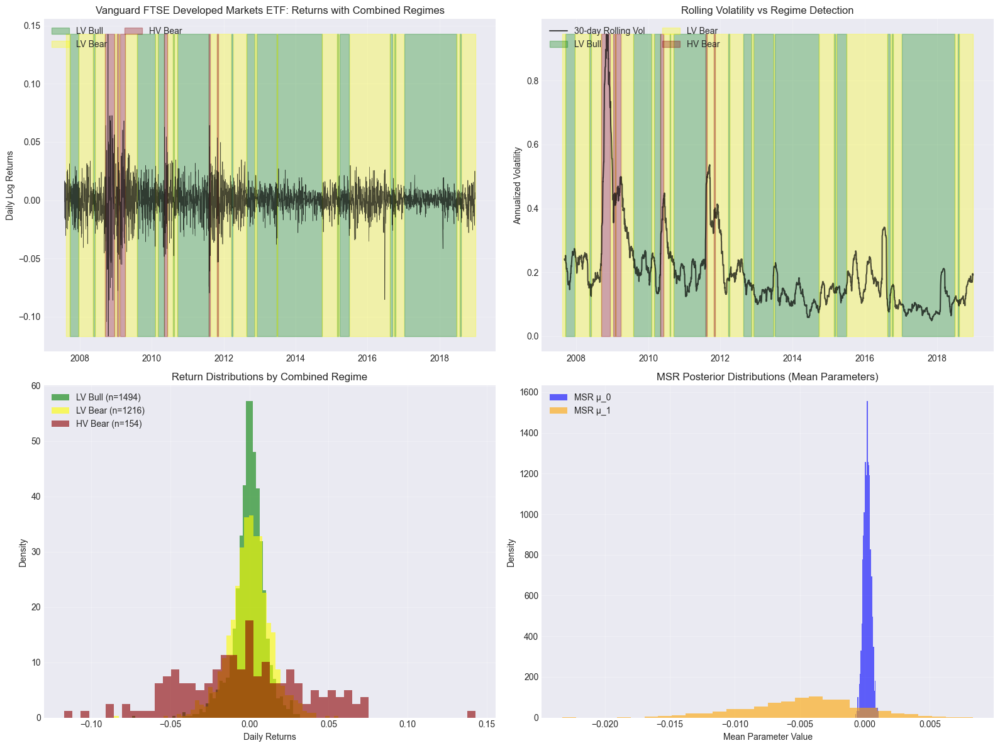


KAMA+MSR MODEL DIAGNOSTICS - VANGUARD FTSE DEVELOPED MARKETS ETF

Combined Model Fit Statistics:
Log-Likelihood: 8294.13
Average Log-Likelihood: 2.88

KAMA Tracking Error (vs returns): 0.014642
KAMA Efficiency Ratio (mean): 0.2560

Regime Stability:
  Total regime changes: 42
  Average regime duration: 66.9 periods
  Change frequency: 1.46%


Analyzing Vanguard FTSE Emerging Markets ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 10
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.75

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------

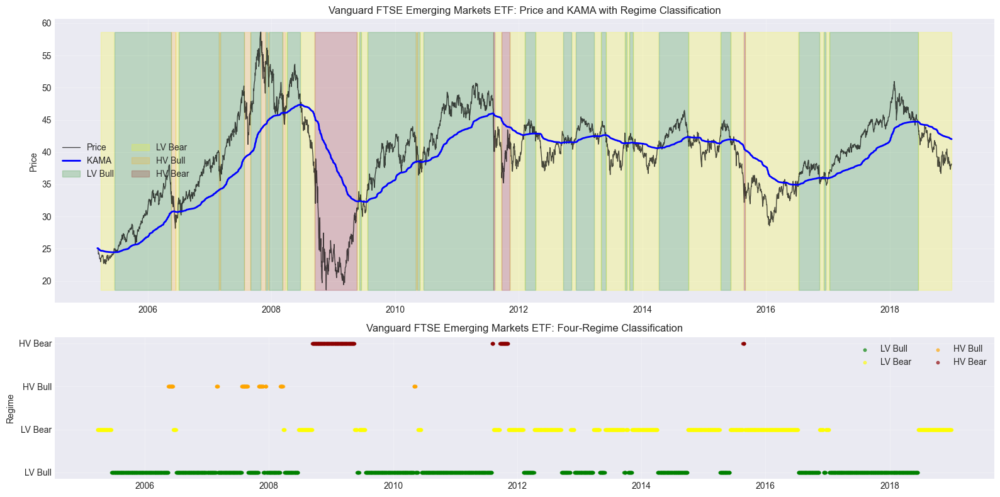

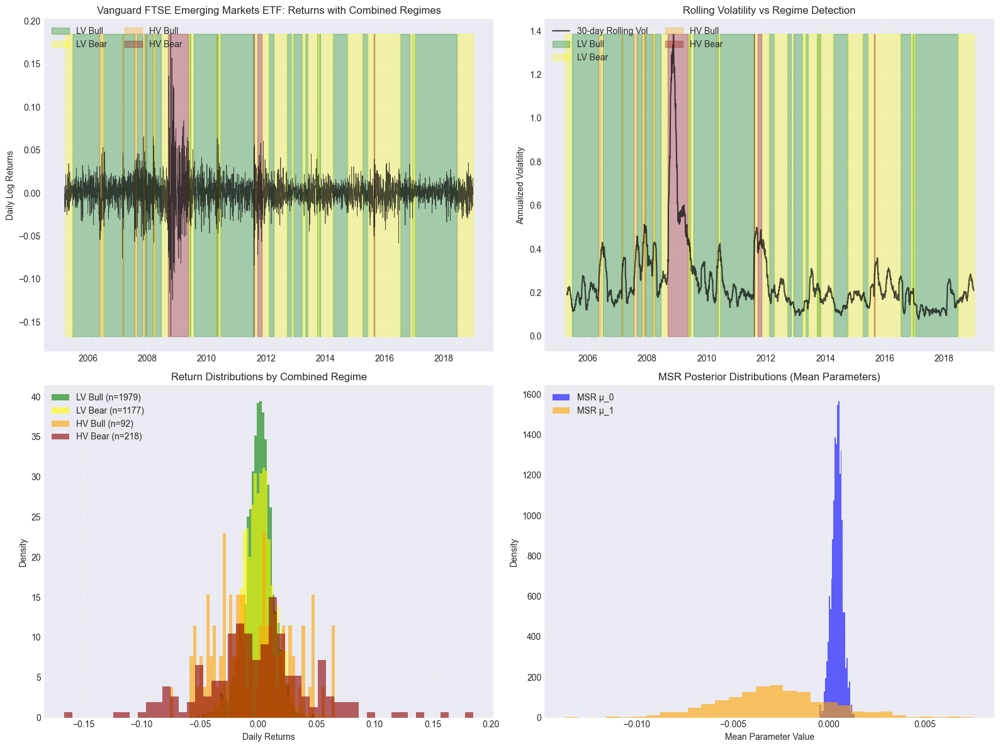


KAMA+MSR MODEL DIAGNOSTICS - VANGUARD FTSE EMERGING MARKETS ETF

Combined Model Fit Statistics:
Log-Likelihood: 9532.00
Average Log-Likelihood: 2.74

KAMA Tracking Error (vs returns): 0.018104
KAMA Efficiency Ratio (mean): 0.3020

Regime Stability:
  Total regime changes: 53
  Average regime duration: 64.4 periods
  Change frequency: 1.52%


Analyzing Vanguard FTSE Europe ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 10
KAMA n_fast: 3
    KAMA k_fast: 0.500000
KAMA n_slow: 25
    KAMA k_slow: 0.076923
gamma: 1.5000000000000002

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
--------

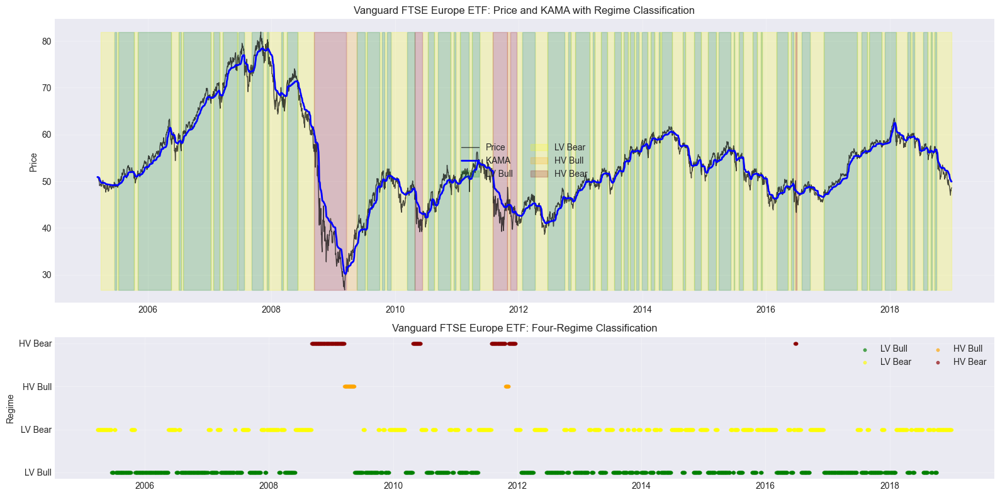

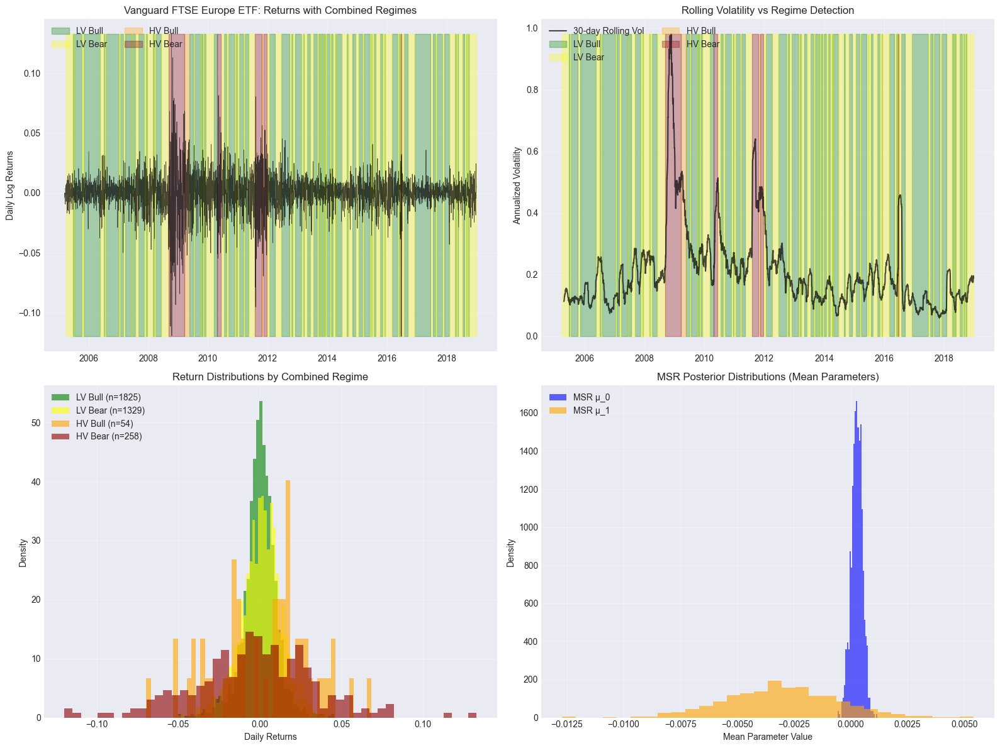


KAMA+MSR MODEL DIAGNOSTICS - VANGUARD FTSE EUROPE ETF

Combined Model Fit Statistics:
Log-Likelihood: 10065.02
Average Log-Likelihood: 2.90

KAMA Tracking Error (vs returns): 0.014646
KAMA Efficiency Ratio (mean): 0.3059

Regime Stability:
  Total regime changes: 121
  Average regime duration: 28.5 periods
  Change frequency: 3.48%


Analyzing Vanguard FTSE Pacific ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 26
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 45
    KAMA k_slow: 0.043478
gamma: 0.85

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------

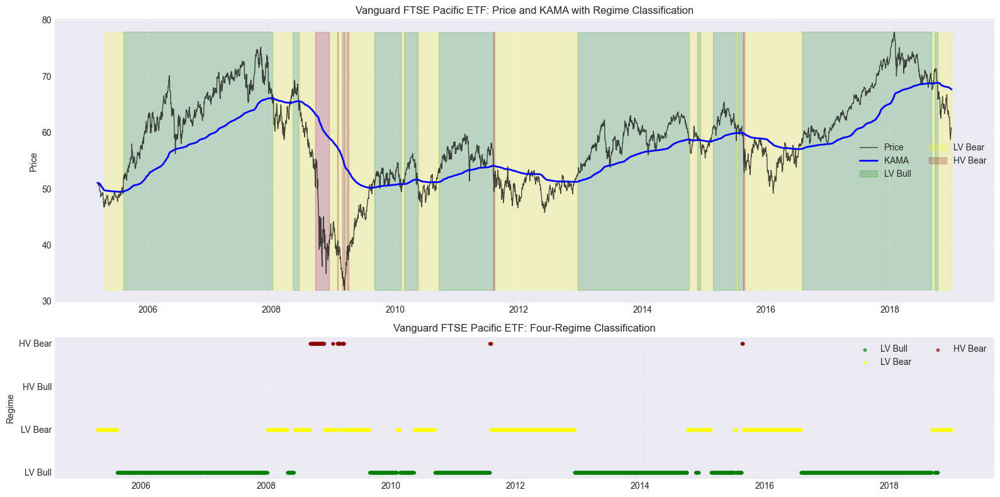

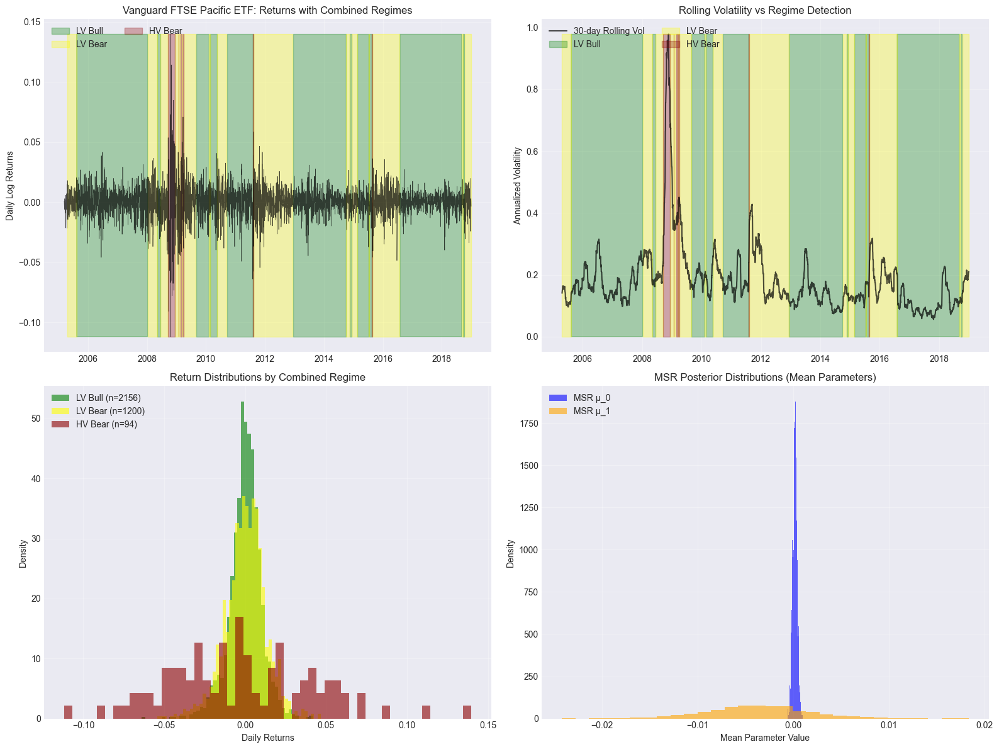


KAMA+MSR MODEL DIAGNOSTICS - VANGUARD FTSE PACIFIC ETF

Combined Model Fit Statistics:
Log-Likelihood: 10306.10
Average Log-Likelihood: 2.96

KAMA Tracking Error (vs returns): 0.013157
KAMA Efficiency Ratio (mean): 0.1831

Regime Stability:
  Total regime changes: 32
  Average regime duration: 105.3 periods
  Change frequency: 0.92%


Analyzing iShares China Large-Cap ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 10
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 40
    KAMA k_slow: 0.048780
gamma: 0.6000000000000001

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
-----------

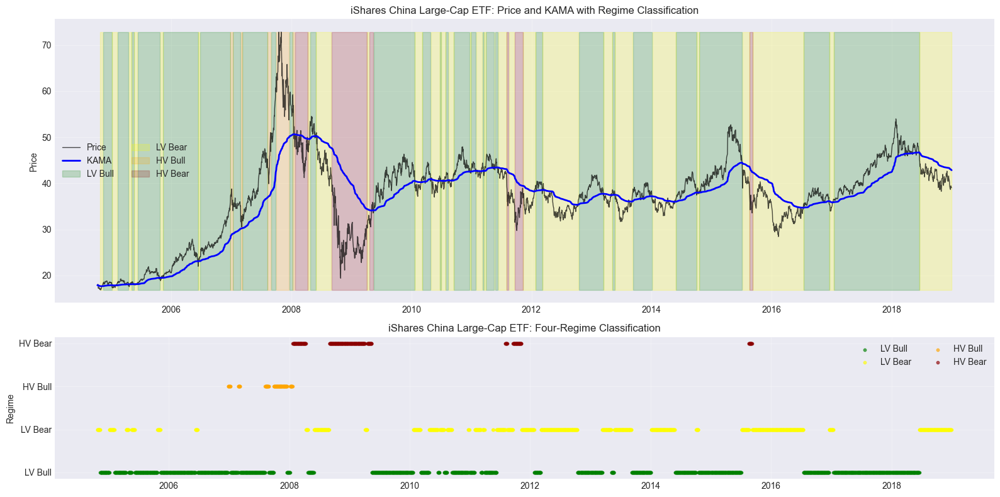

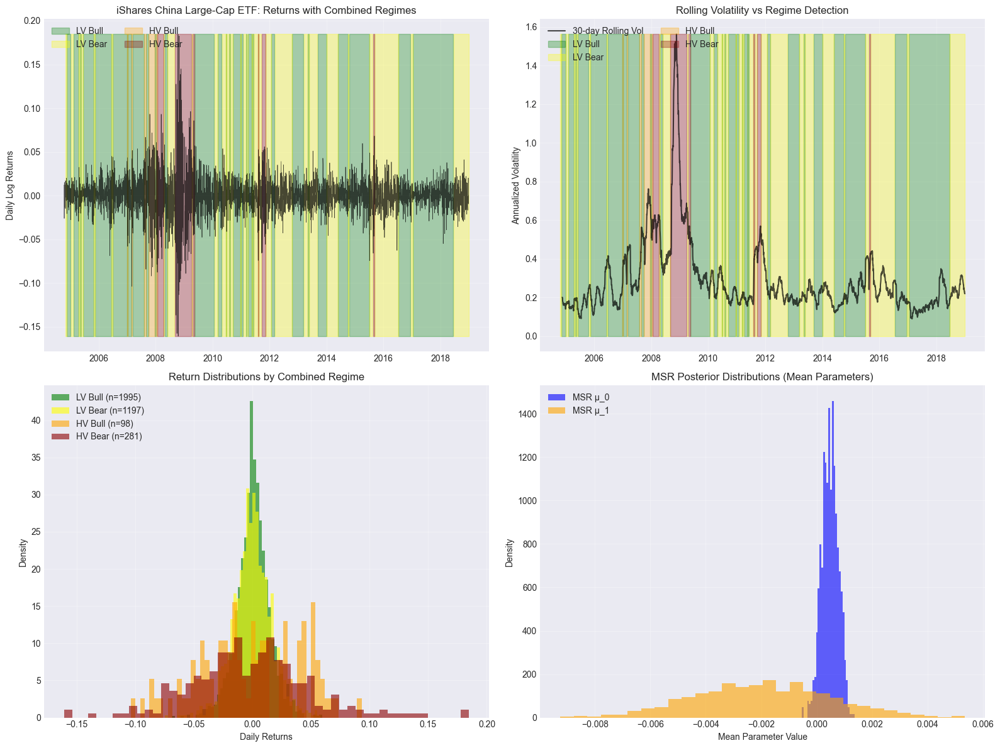


KAMA+MSR MODEL DIAGNOSTICS - ISHARES CHINA LARGE-CAP ETF

Combined Model Fit Statistics:
Log-Likelihood: 9259.83
Average Log-Likelihood: 2.59

KAMA Tracking Error (vs returns): 0.021229
KAMA Efficiency Ratio (mean): 0.3133

Regime Stability:
  Total regime changes: 67
  Average regime duration: 52.7 periods
  Change frequency: 1.87%


Analyzing iShares MSCI Japan ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 15
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 45
    KAMA k_slow: 0.043478
gamma: 0.85

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
------------------------------

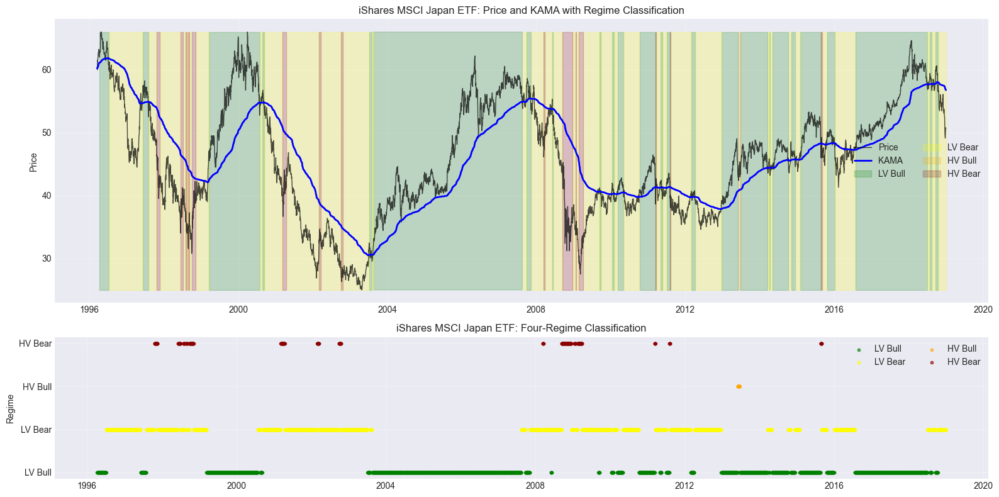

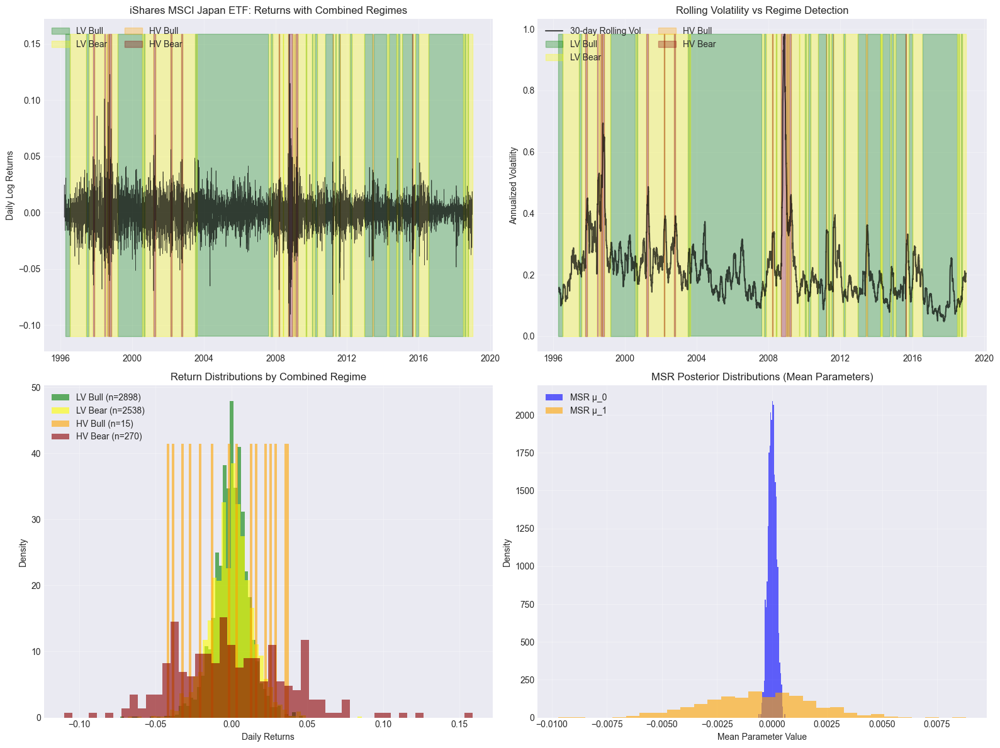


KAMA+MSR MODEL DIAGNOSTICS - ISHARES MSCI JAPAN ETF

Combined Model Fit Statistics:
Log-Likelihood: 16255.83
Average Log-Likelihood: 2.83

KAMA Tracking Error (vs returns): 0.014832
KAMA Efficiency Ratio (mean): 0.2381

Regime Stability:
  Total regime changes: 76
  Average regime duration: 74.5 periods
  Change frequency: 1.32%


Analyzing iShares MSCI India ETF in asset class int_equity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 25
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.75

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------

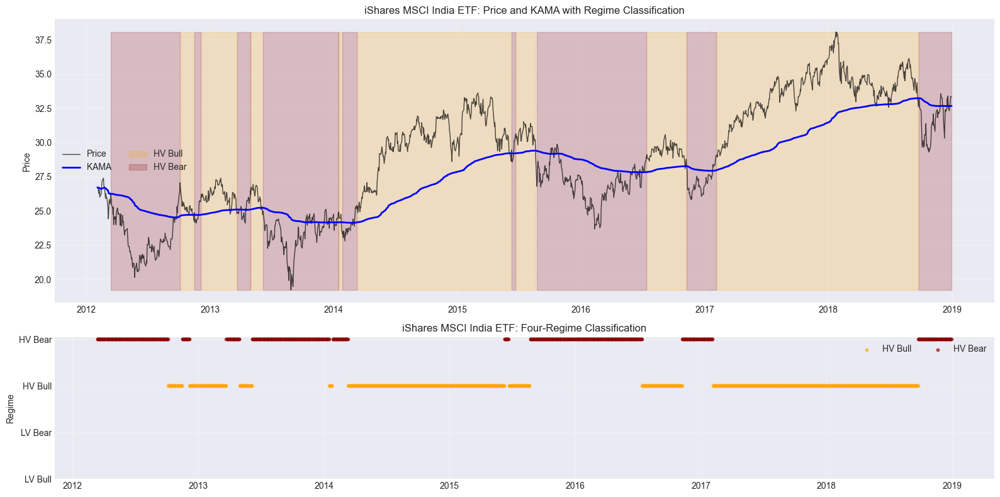

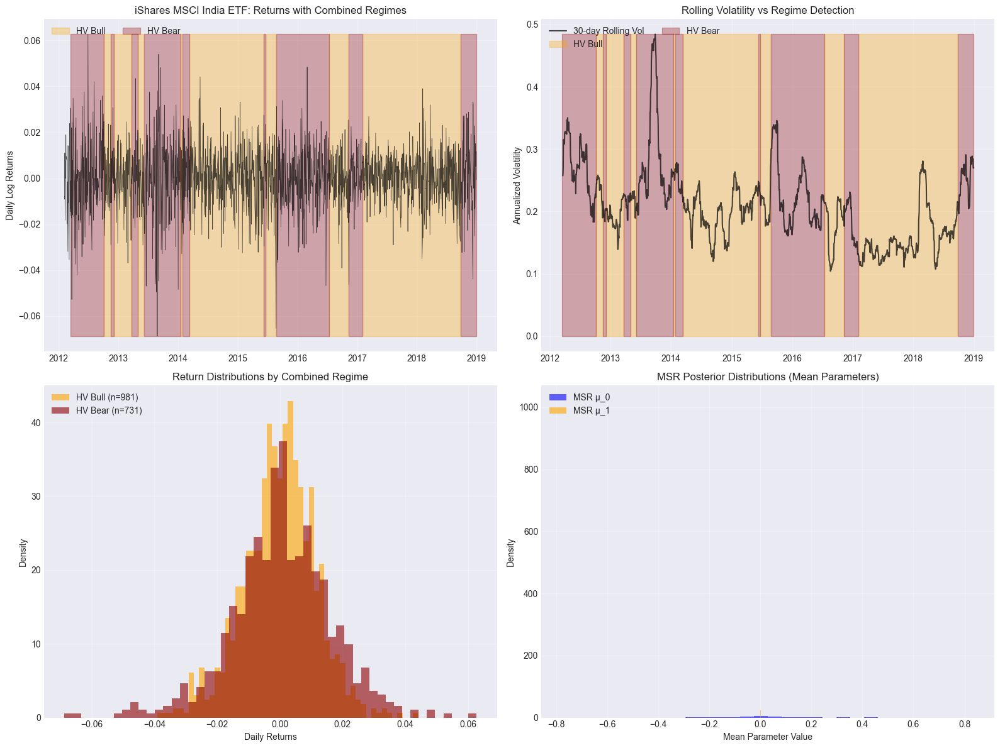


KAMA+MSR MODEL DIAGNOSTICS - ISHARES MSCI INDIA ETF

Combined Model Fit Statistics:
Log-Likelihood: 4908.57
Average Log-Likelihood: 2.83

KAMA Tracking Error (vs returns): 0.013590
KAMA Efficiency Ratio (mean): 0.1850

Regime Stability:
  Total regime changes: 16
  Average regime duration: 102.2 periods
  Change frequency: 0.92%


Analyzing Gold Futures in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 26
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.75

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Pric

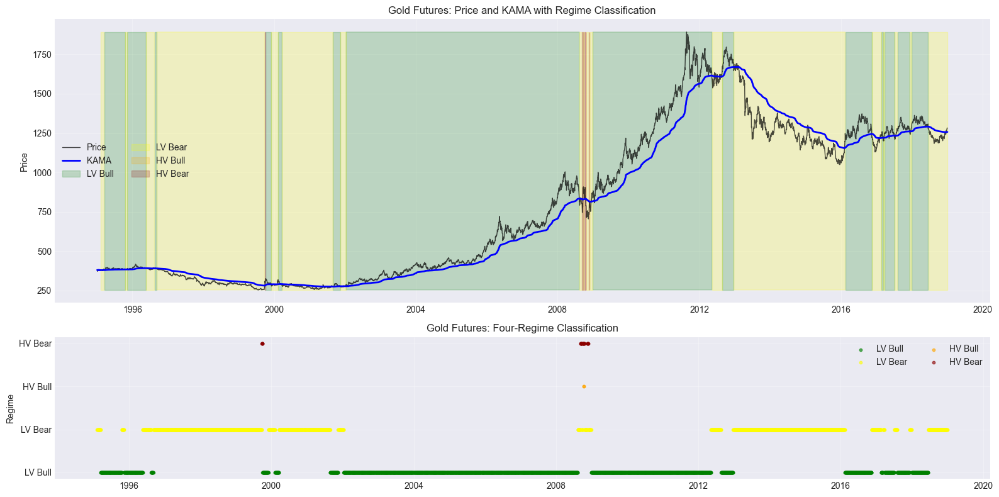

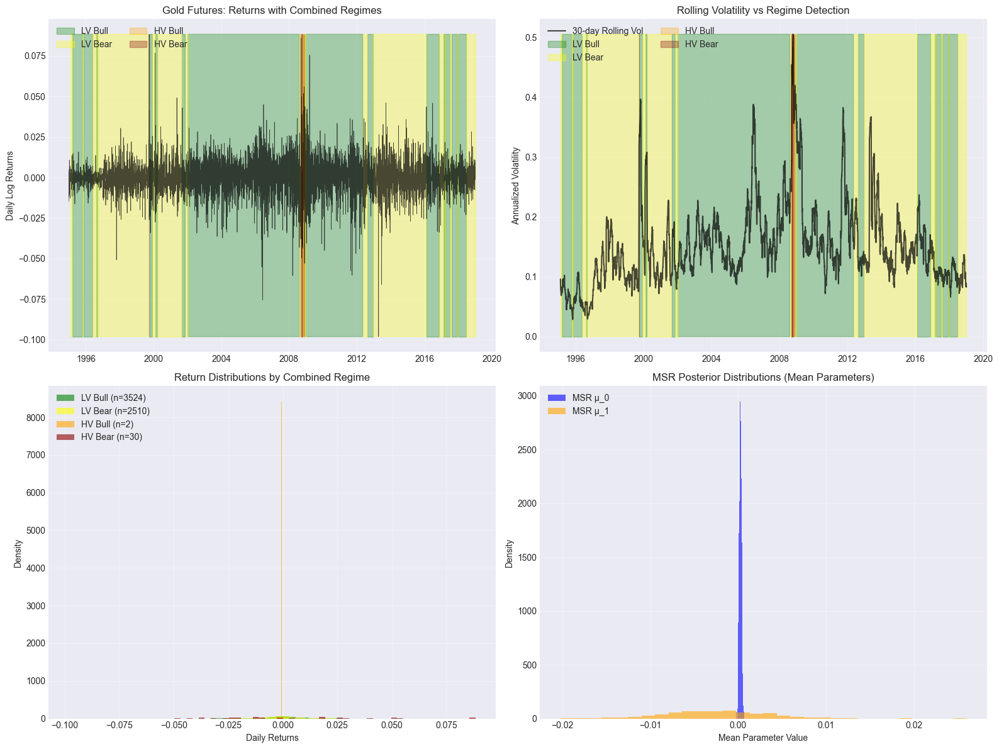


KAMA+MSR MODEL DIAGNOSTICS - GOLD FUTURES

Combined Model Fit Statistics:
Log-Likelihood: 19104.99
Average Log-Likelihood: 3.14

KAMA Tracking Error (vs returns): 0.010374
KAMA Efficiency Ratio (mean): 0.2072

Regime Stability:
  Total regime changes: 39
  Average regime duration: 152.3 periods
  Change frequency: 0.64%


Analyzing Wheat Futures in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 26
KAMA n_fast: 9
    KAMA k_fast: 0.200000
KAMA n_slow: 35
    KAMA k_slow: 0.055556
gamma: 0.75

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data le

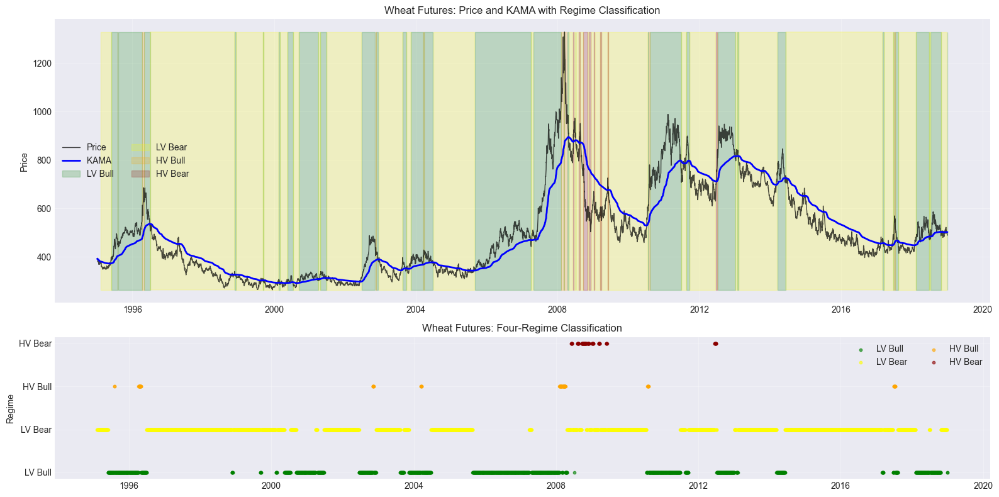

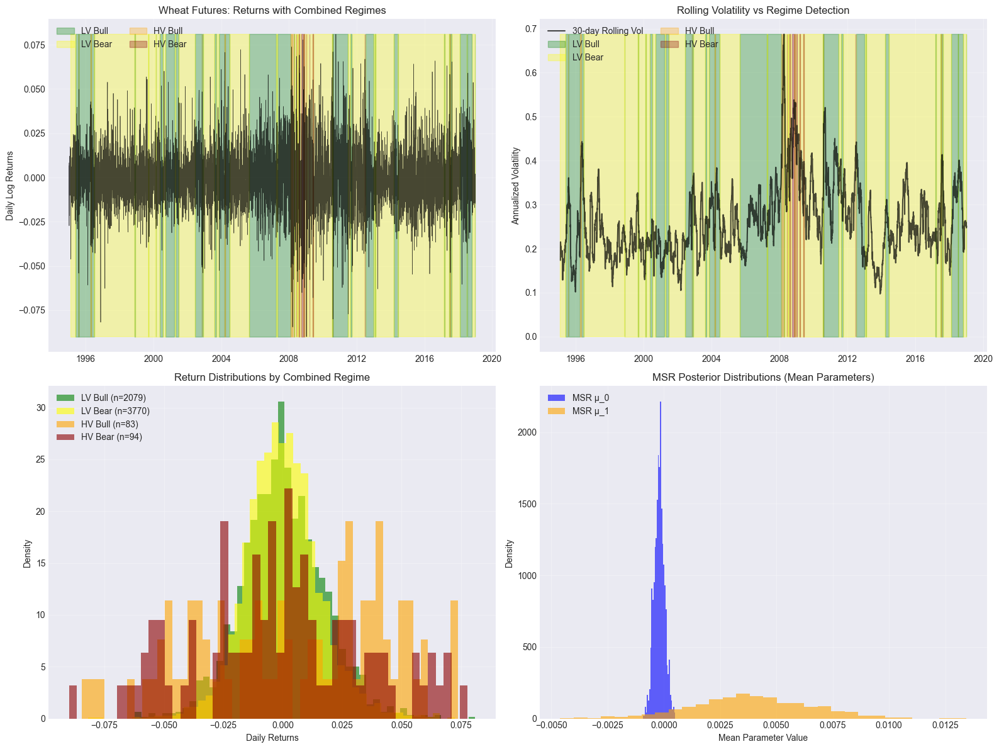


KAMA+MSR MODEL DIAGNOSTICS - WHEAT FUTURES

Combined Model Fit Statistics:
Log-Likelihood: 15964.35
Average Log-Likelihood: 2.64

KAMA Tracking Error (vs returns): 0.017044
KAMA Efficiency Ratio (mean): 0.1935

Regime Stability:
  Total regime changes: 77
  Average regime duration: 77.6 periods
  Change frequency: 1.27%


Analyzing Corn Futures in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 8
KAMA n_fast: 2
    KAMA k_fast: 0.666667
KAMA n_slow: 20
    KAMA k_slow: 0.095238
gamma: 0.9

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data lengt

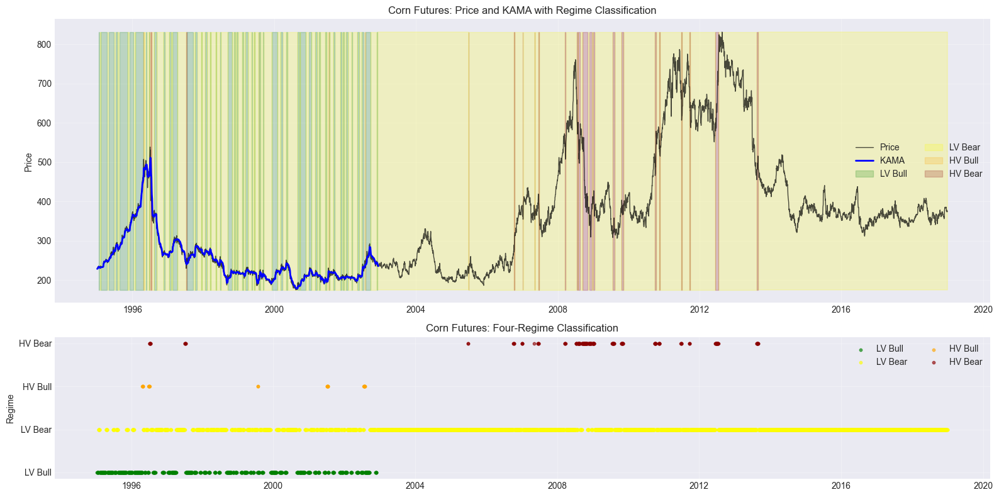

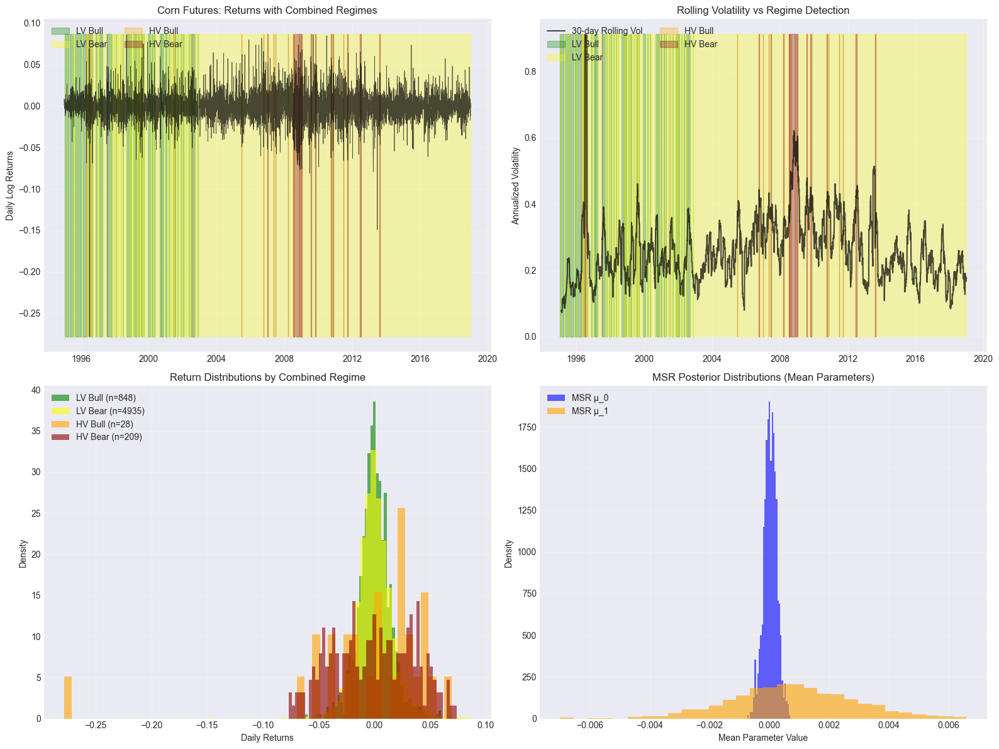


KAMA+MSR MODEL DIAGNOSTICS - CORN FUTURES

Combined Model Fit Statistics:
Log-Likelihood: 15880.16
Average Log-Likelihood: 2.63

KAMA Tracking Error (vs returns): 0.014592
KAMA Efficiency Ratio (mean): 0.3738

Regime Stability:
  Total regime changes: 141
  Average regime duration: 42.5 periods
  Change frequency: 2.34%


Analyzing Copper in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 26
KAMA n_fast: 8
    KAMA k_fast: 0.222222
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.3

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data length: 60

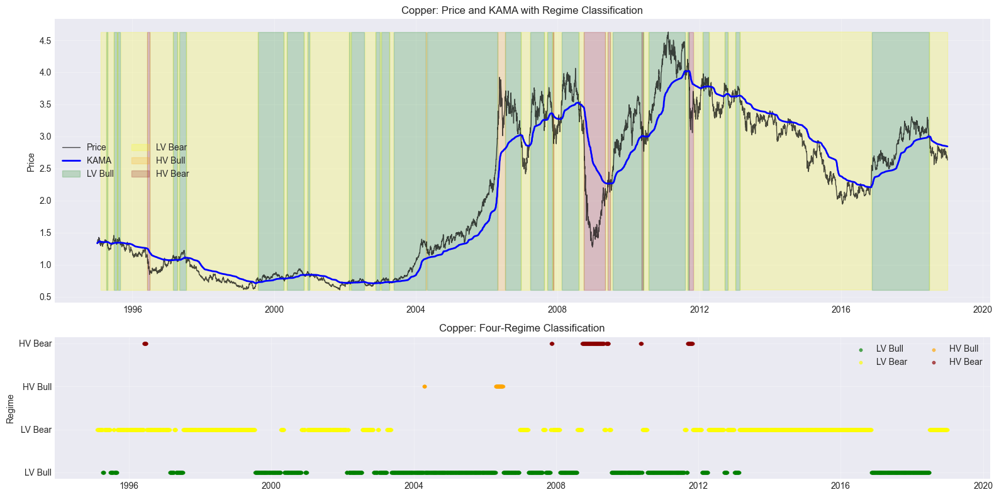

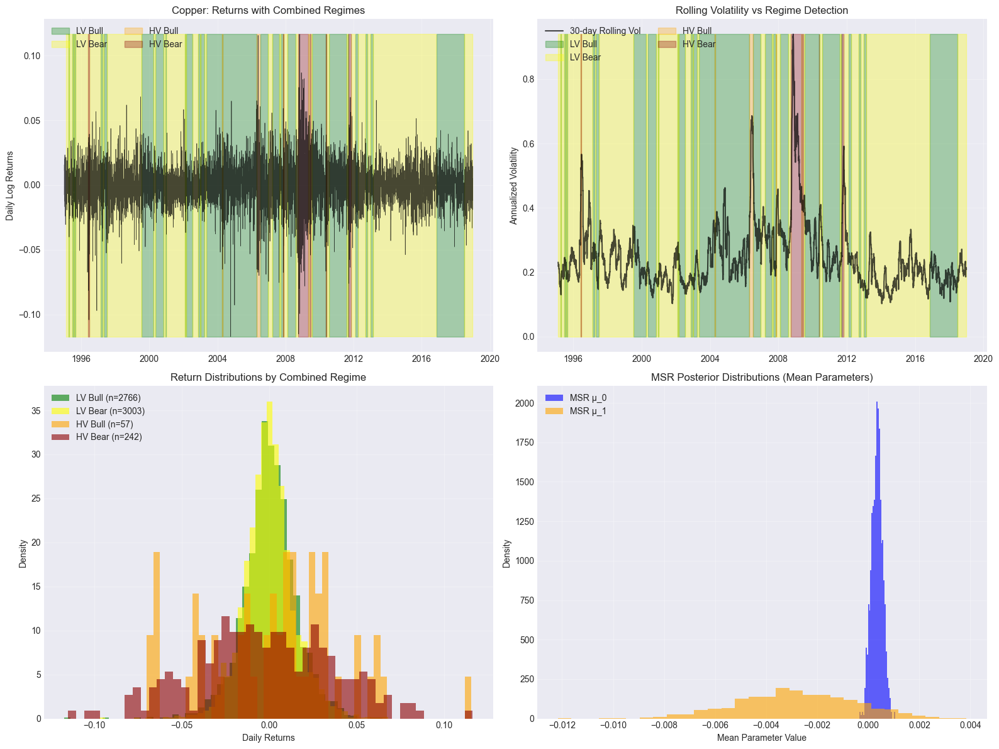


KAMA+MSR MODEL DIAGNOSTICS - COPPER

Combined Model Fit Statistics:
Log-Likelihood: 16509.06
Average Log-Likelihood: 2.71

KAMA Tracking Error (vs returns): 0.016701
KAMA Efficiency Ratio (mean): 0.1975

Regime Stability:
  Total regime changes: 61
  Average regime duration: 98.3 periods
  Change frequency: 1.00%


Analyzing Sugar in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 25
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 40
    KAMA k_slow: 0.048780
gamma: 1.3

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data length: 6012
Retu

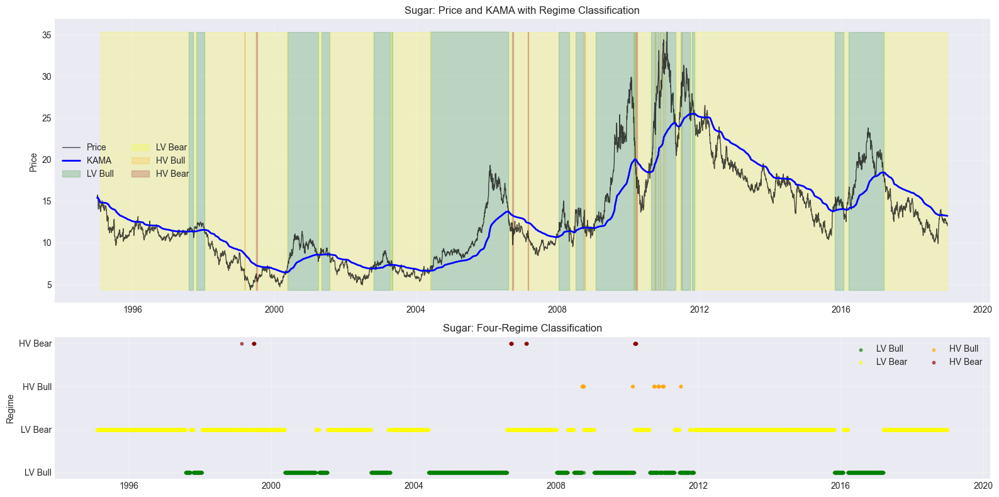

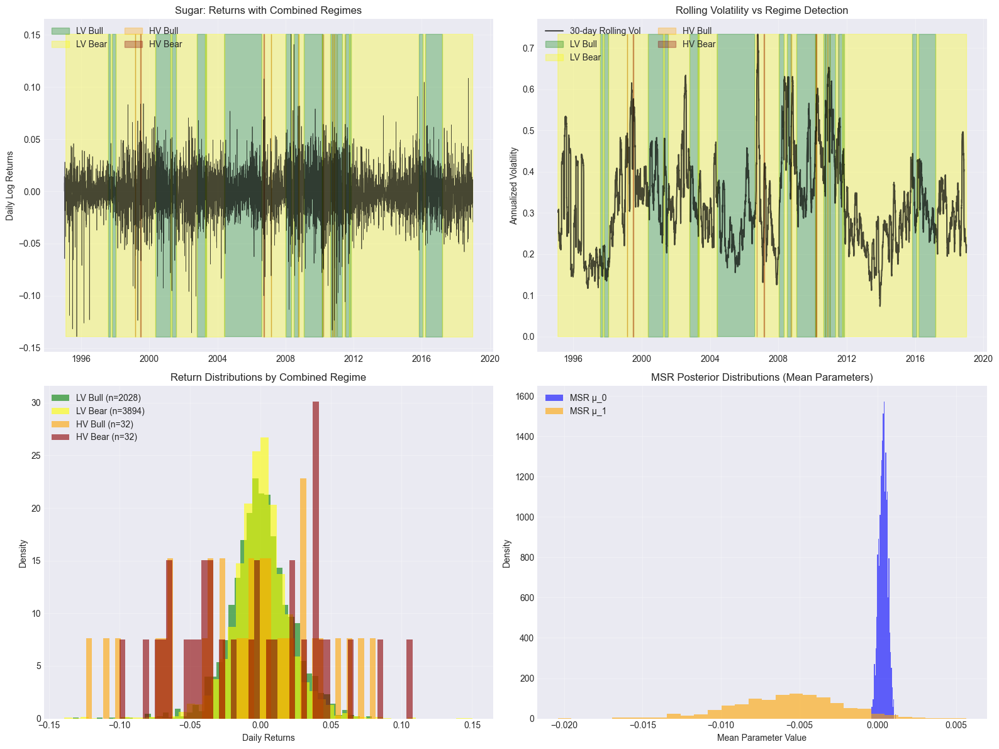


KAMA+MSR MODEL DIAGNOSTICS - SUGAR

Combined Model Fit Statistics:
Log-Likelihood: 14410.93
Average Log-Likelihood: 2.40

KAMA Tracking Error (vs returns): 0.021394
KAMA Efficiency Ratio (mean): 0.2116

Regime Stability:
  Total regime changes: 54
  Average regime duration: 109.3 periods
  Change frequency: 0.90%


Analyzing Soybean Futures in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 26
KAMA n_fast: 9
    KAMA k_fast: 0.200000
KAMA n_slow: 32
    KAMA k_slow: 0.060606
gamma: 0.3

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data length: 

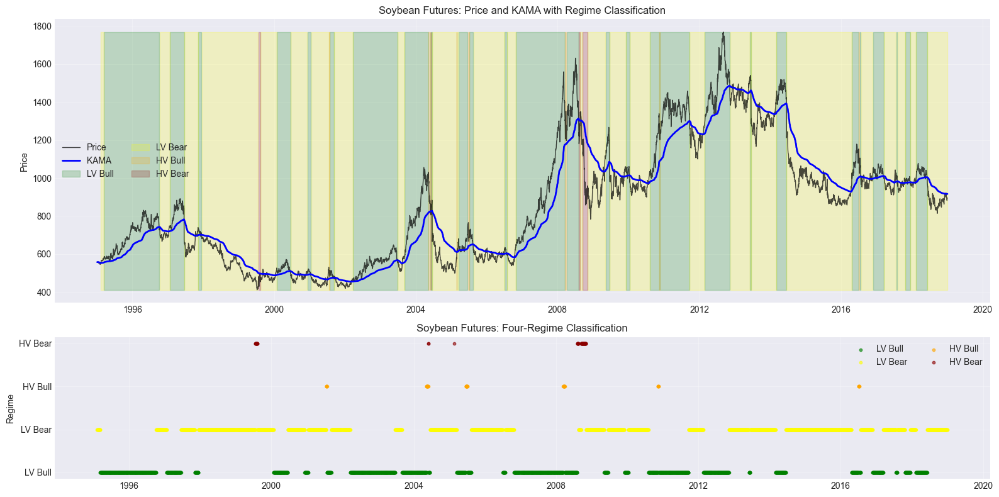

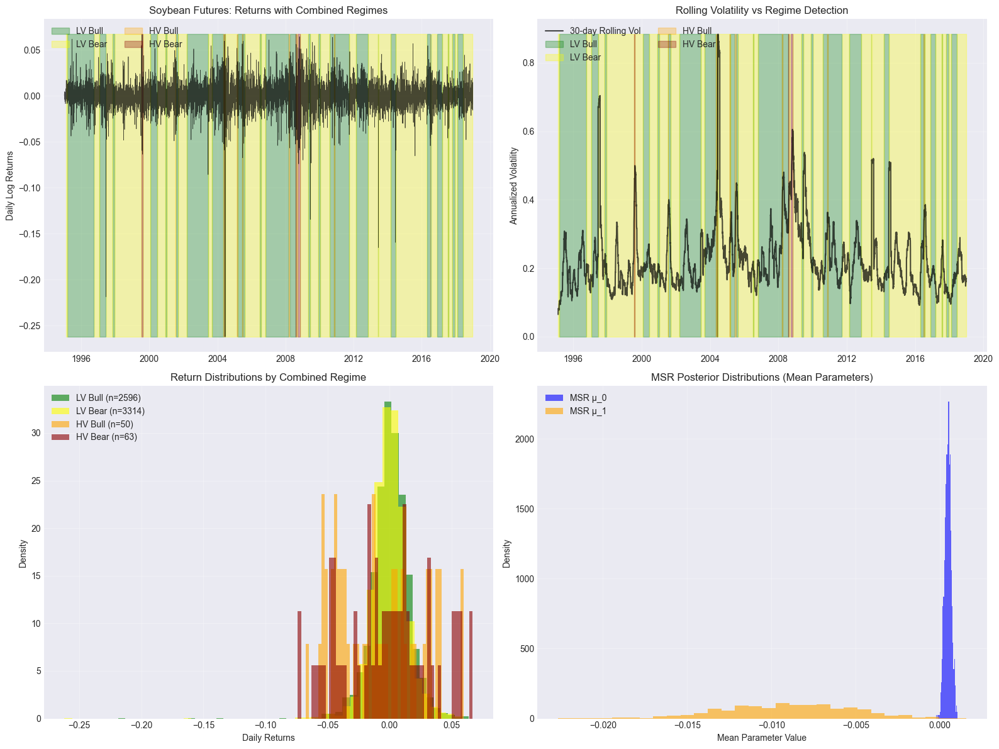


KAMA+MSR MODEL DIAGNOSTICS - SOYBEAN FUTURES

Combined Model Fit Statistics:
Log-Likelihood: 16441.24
Average Log-Likelihood: 2.72

KAMA Tracking Error (vs returns): 0.015587
KAMA Efficiency Ratio (mean): 0.2109

Regime Stability:
  Total regime changes: 65
  Average regime duration: 91.7 periods
  Change frequency: 1.07%


Analyzing Live Cattle Futures in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 25
KAMA n_fast: 2
    KAMA k_fast: 0.666667
KAMA n_slow: 29
    KAMA k_slow: 0.066667
gamma: 0.55

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price

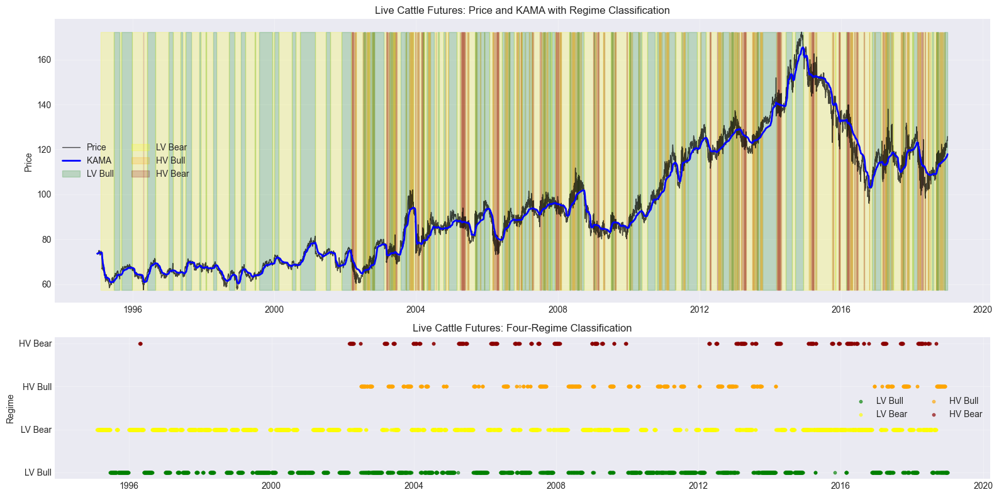

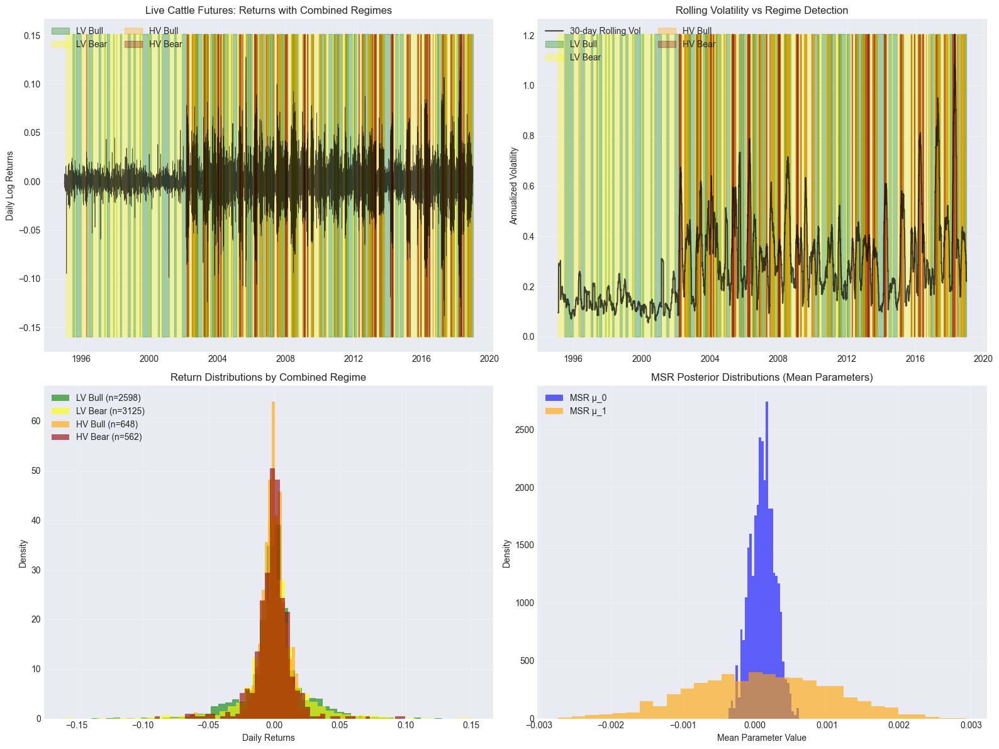


KAMA+MSR MODEL DIAGNOSTICS - LIVE CATTLE FUTURES

Combined Model Fit Statistics:
Log-Likelihood: 15762.61
Average Log-Likelihood: 2.27

KAMA Tracking Error (vs returns): 0.020315
KAMA Efficiency Ratio (mean): 0.1395

Regime Stability:
  Total regime changes: 775
  Average regime duration: 9.0 periods
  Change frequency: 11.14%


Analyzing Natural Gas in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 25
KAMA n_fast: 10
    KAMA k_fast: 0.181818
KAMA n_slow: 43
    KAMA k_slow: 0.045455
gamma: 0.75

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price d

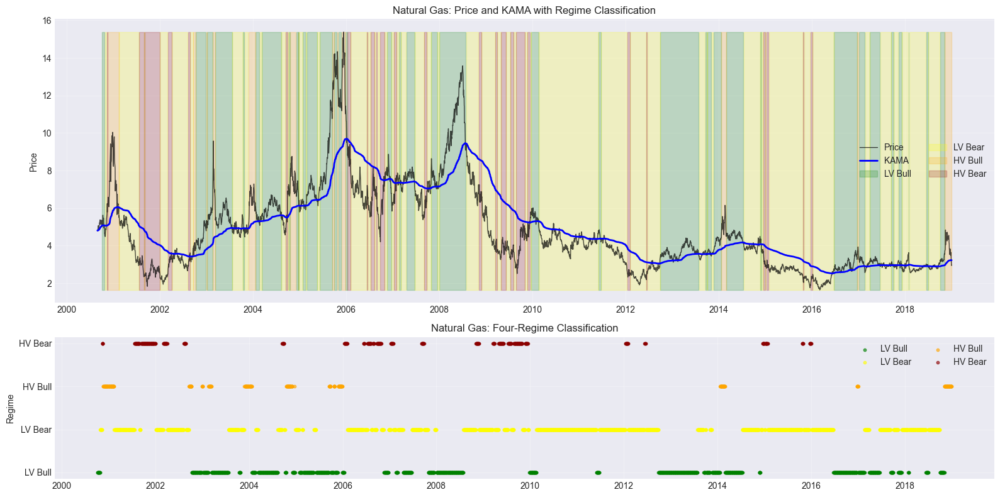

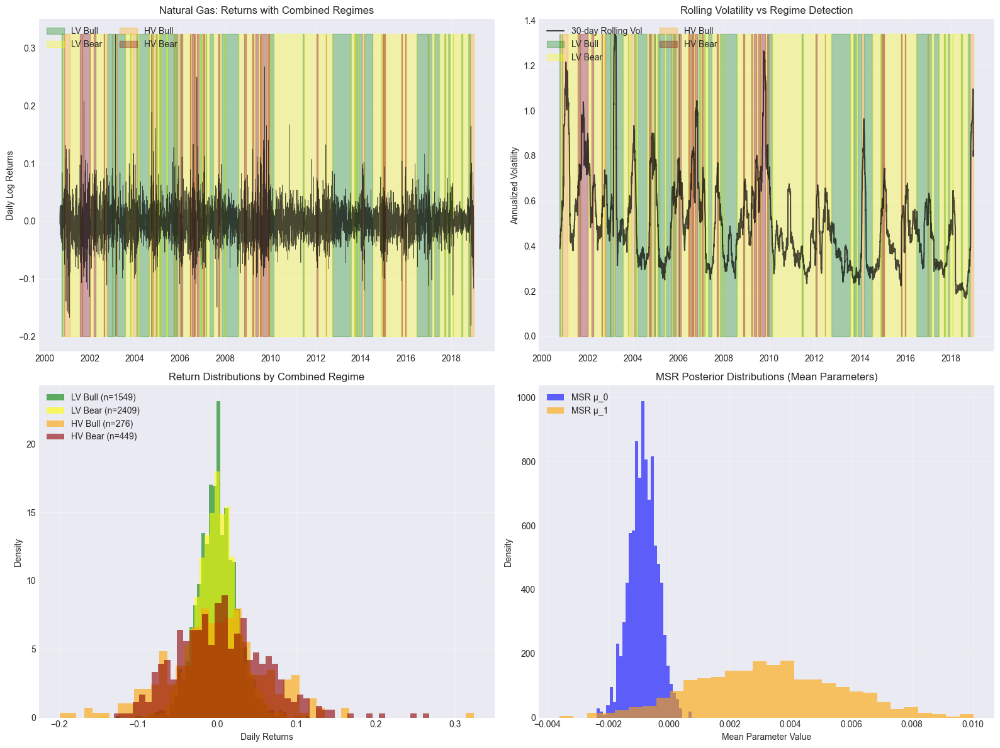


KAMA+MSR MODEL DIAGNOSTICS - NATURAL GAS

Combined Model Fit Statistics:
Log-Likelihood: 9162.72
Average Log-Likelihood: 1.95

KAMA Tracking Error (vs returns): 0.033420
KAMA Efficiency Ratio (mean): 0.1973

Regime Stability:
  Total regime changes: 125
  Average regime duration: 37.4 periods
  Change frequency: 2.66%


Analyzing Coffee in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 14
KAMA n_fast: 3
    KAMA k_fast: 0.500000
KAMA n_slow: 38
    KAMA k_slow: 0.051282
gamma: 0.5

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data length: 6010

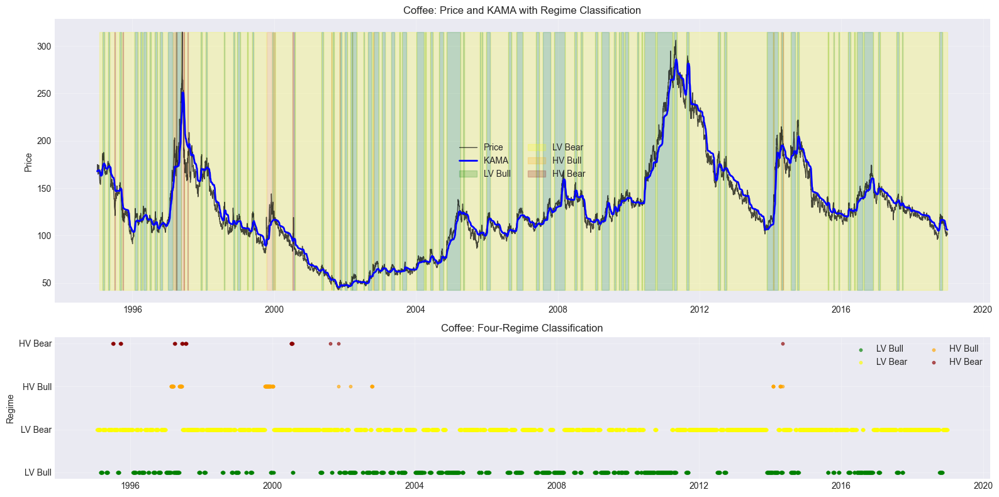

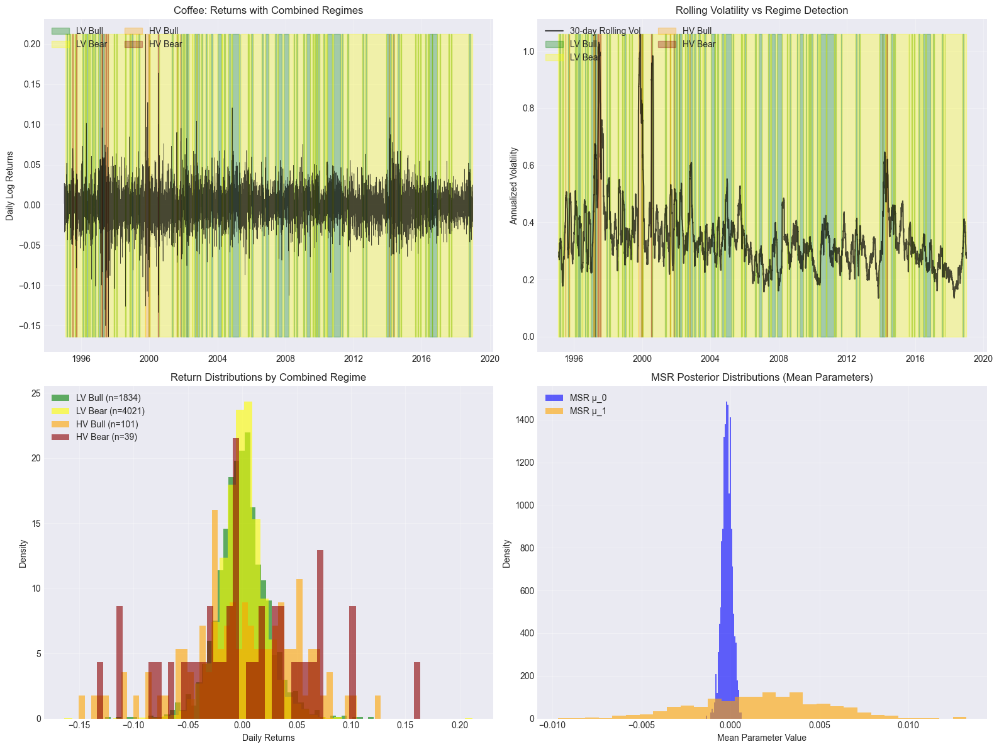


KAMA+MSR MODEL DIAGNOSTICS - COFFEE

Combined Model Fit Statistics:
Log-Likelihood: 14129.66
Average Log-Likelihood: 2.35

KAMA Tracking Error (vs returns): 0.021945
KAMA Efficiency Ratio (mean): 0.2663

Regime Stability:
  Total regime changes: 184
  Average regime duration: 32.5 periods
  Change frequency: 3.06%


Analyzing Brent Crude Oil in asset class commodity...

LOADED MODEL INFORMATION

2. KAMA PARAMETERS:
----------------------------------------
KAMA n: 16
KAMA n_fast: 12
    KAMA k_fast: 0.153846
KAMA n_slow: 44
    KAMA k_slow: 0.044444
gamma: 0.5

3. MSR PRIORS:
----------------------------------------
mean_prior_mean: 0.0
mean_prior_var: 0.1
beta_prior_mean: 0.0
beta_prior_var: 1.0
sigma_prior_shape: 2.0
sigma_prior_scale: 0.1
transition_prior_alpha: 8.0

4. MODEL CONFIGURATION:
----------------------------------------
use_three_state_msr: False
Number of combined regimes: 4
MSR n_regimes: 2

5. DATA INFORMATION:
----------------------------------------
Price data length

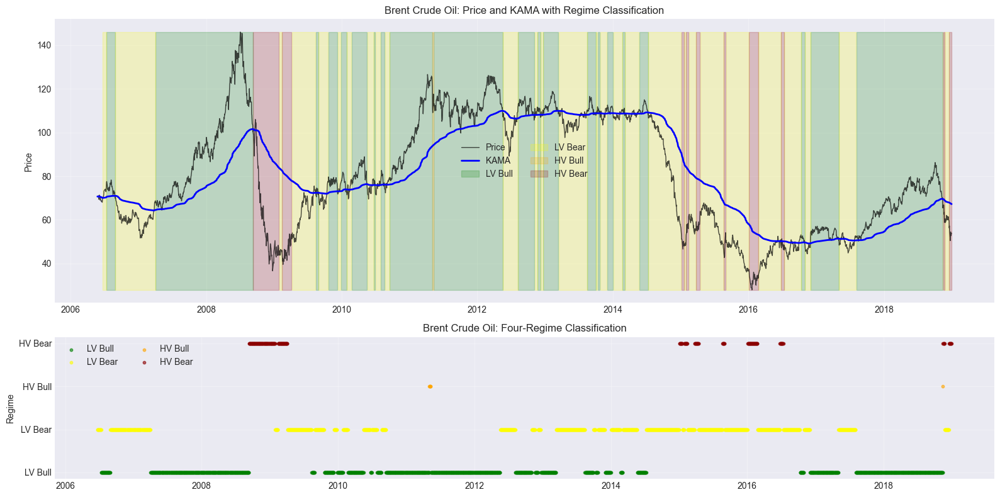

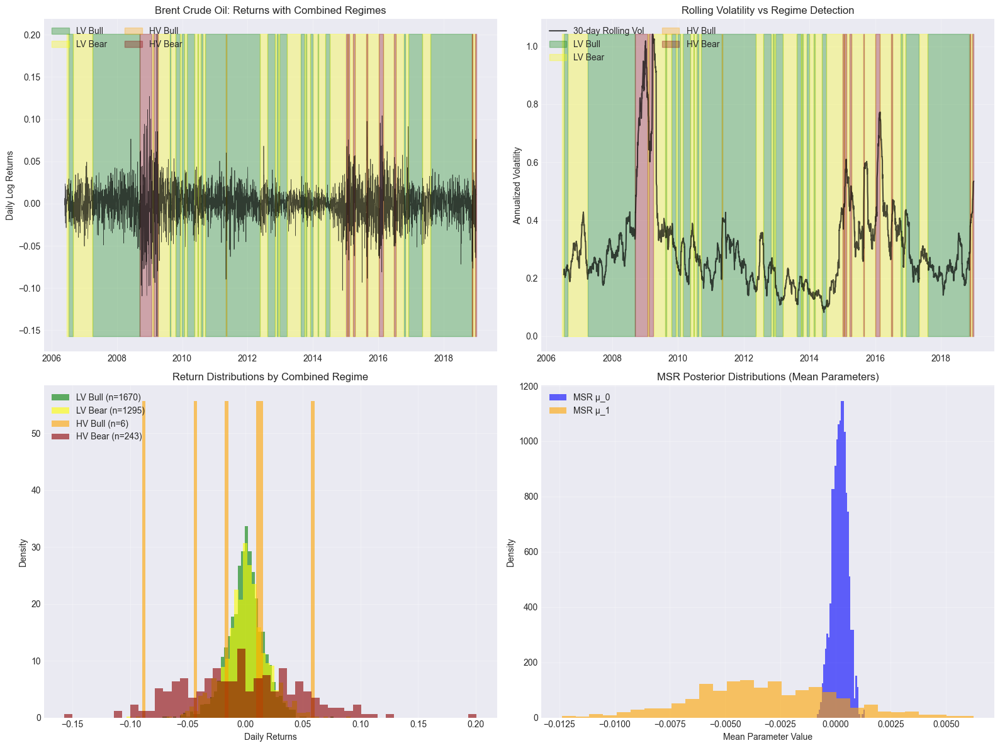


KAMA+MSR MODEL DIAGNOSTICS - BRENT CRUDE OIL

Combined Model Fit Statistics:
Log-Likelihood: 7948.17
Average Log-Likelihood: 2.46

KAMA Tracking Error (vs returns): 0.021638
KAMA Efficiency Ratio (mean): 0.2683

Regime Stability:
  Total regime changes: 60
  Average regime duration: 53.0 periods
  Change frequency: 1.86%


In [15]:
for asset_class in asset_classes.keys():
    for asset_name in asset_classes[asset_class]:
        print(f"\n\nAnalyzing {asset_name} in asset class {asset_class}...\n")
        n_regimes = 2  # Assuming 2 regimes for this example
        sub_folder = asset_class
        edte_sub_folder = '20190101'
        
        loaded_model, transition_results = load_and_analyze_KAMA_MSR_model(
            asset_name=asset_name,
            n_regimes=n_regimes,
            sub_folder=sub_folder,
            edte_sub_folder=edte_sub_folder
        )
        master_label_df[(asset_class, asset_name)] = loaded_model.regime_labels

In [20]:
master_label_df = master_label_df.dropna(how='all')

In [21]:
master_label_df.to_csv('data/master_label_df.csv', index=True)